# Chest X-Ray Pneumonia Detection System
**Author:** Elif Sila Okutucu  
**Course:** PS26 — DSC01 Machine Learning  
**Dataset:** [Chest X-Ray Images (Pneumonia) — Paul Mooney / Kaggle](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia)

## Research Questions
| Number | Question |
|---|----------|
| RQ1 | How effectively can a custom CNN classify pneumonia from chest X-ray images? |
| RQ2 | To what extent do transfer learning models outperform a custom CNN across accuracy, recall, F1-score, and AUC-ROC? |
| RQ3 | Can class weighting mitigate the impact of class imbalance on false negative predictions? |
| RQ4 | How do evaluation metrics affect pneumonia classification assessment? |
| RQ5 | What insights can Grad-CAM provide about model decision-making?|
| RQ6 | Does data augmentation improve model generalization? |
| RQ7 | What patterns appear in misclassified chest X-ray images? |

## Notebook Structure
1. Setup & Imports
2. Data Exploration (RQ3 baseline)
3. Preprocessing & Augmentation (RQ6)
4. Custom CNN — Training & Evaluation (RQ1, RQ3, RQ4)
5. Transfer Learning — EfficientNetB0 & ResNet50 (RQ2, RQ3, RQ4)
6. Grad-CAM Explainability (RQ5)
7. Error Analysis (RQ7)
8. Final Model Comparison (RQ2, RQ4)

---
# 1. Setup & Imports

In [2]:
import os, json
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.applications import EfficientNetB0, ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.efficientnet import preprocess_input as effnet_preprocess
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_curve, auc
)
from sklearn.utils.class_weight import compute_class_weight
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# ── Output directories ───────────────────────────────────────────────────────
os.makedirs('/kaggle/working/outputs/figures', exist_ok=True)
os.makedirs('/kaggle/working/outputs/tables',  exist_ok=True)
os.makedirs('/kaggle/working/outputs/models',  exist_ok=True)

# ── Constants ────────────────────────────────────────────────────────────────
SEED       = 42
IMG_SIZE   = (224, 224)
BATCH_SIZE = 32
EPOCHS     = 20
VAL_SPLIT  = 0.20
CLASSES    = ['NORMAL', 'PNEUMONIA']
# Auto-detect correct DATA_ROOT path
_base = '/kaggle/input/datasets/paultimothymooney/chest-xray-pneumonia'
if os.path.exists(os.path.join(_base, 'chest_xray', 'train')):
    DATA_ROOT = os.path.join(_base, 'chest_xray')
elif os.path.exists(os.path.join(_base, 'train')):
    DATA_ROOT = _base
else:
    raise FileNotFoundError(f'Dataset not found under {_base}')

COLORS = {
    'Custom CNN'    : '#4A90D9',
    'EfficientNetB0': '#E84040',
    'ResNet50'      : '#28A745'
}

tf.random.set_seed(SEED)
np.random.seed(SEED)

print(f'TensorFlow : {tf.__version__}')
print('GPU        :', tf.config.list_physical_devices('GPU'))
print('DATA_ROOT  :', DATA_ROOT)
print('Exists     :', os.path.exists(DATA_ROOT))

2026-06-23 21:33:51.097101: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1782250431.340549      58 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1782250431.406188      58 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1782250431.954136      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782250431.954180      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782250431.954183      58 computation_placer.cc:177] computation placer alr

TensorFlow : 2.19.0
GPU        : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
DATA_ROOT  : /kaggle/input/datasets/paultimothymooney/chest-xray-pneumonia/chest_xray
Exists     : True


---
# 2. Data Exploration

In [3]:
# ── 2.1 Image counts per split ───────────────────────────────────────────────
SPLITS = ['train', 'test']   # val folder has only 16 images — ignored, we use train split instead

counts = {}
for split in SPLITS:
    counts[split] = {}
    for cls in CLASSES:
        path = os.path.join(DATA_ROOT, split, cls)
        counts[split][cls] = len(os.listdir(path)) if os.path.exists(path) else 0

rows = []
for split in SPLITS:
    n = counts[split]['NORMAL']
    p = counts[split]['PNEUMONIA']
    t = n + p
    if t == 0:
        print(f'Skipping {split} — no images found.')
        continue
    rows.append({
        'Split'          : split.capitalize(),
        'NORMAL'         : n,
        'PNEUMONIA'      : p,
        'Total'          : t,
        'NORMAL_%'       : round(n / t * 100, 1),
        'PNEUMONIA_%'    : round(p / t * 100, 1),
        'Imbalance_Ratio': round(p / n, 2) if n > 0 else None
    })

df_stats = pd.DataFrame(rows)
total_n   = df_stats['NORMAL'].sum()
total_p   = df_stats['PNEUMONIA'].sum()
total_all = df_stats['Total'].sum()

df_stats = pd.concat([df_stats, pd.DataFrame([{
    'Split': 'TOTAL', 'NORMAL': total_n, 'PNEUMONIA': total_p, 'Total': total_all,
    'NORMAL_%'       : round(total_n / total_all * 100, 1),
    'PNEUMONIA_%'    : round(total_p / total_all * 100, 1),
    'Imbalance_Ratio': round(total_p / total_n, 2)
}])], ignore_index=True)

df_stats.to_csv('/kaggle/working/outputs/tables/dataset_stats.csv', index=False)
display(df_stats)

,Split,NORMAL,PNEUMONIA,Total,NORMAL_%,PNEUMONIA_%,Imbalance_Ratio
0,Train,1341,3875,5216,25.7,74.3,2.89
1,Test,234,390,624,37.5,62.5,1.67
2,TOTAL,1575,4265,5840,27.0,73.0,2.71


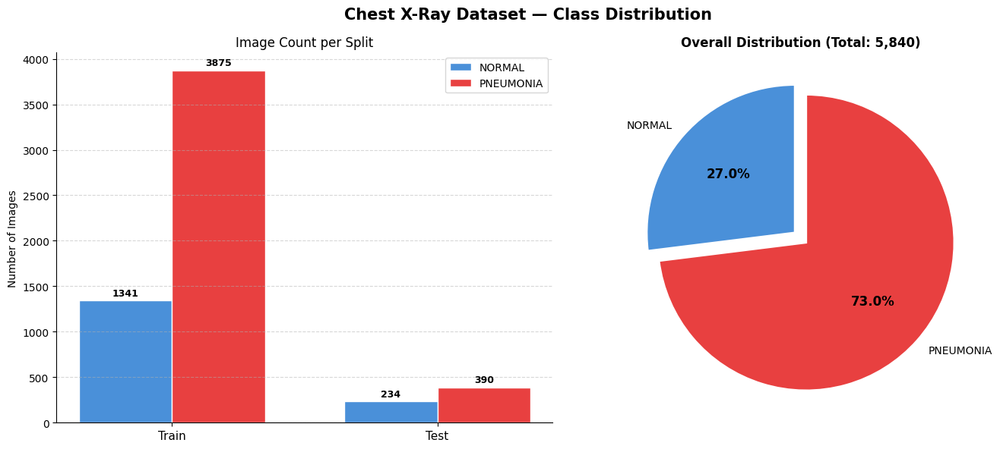

Saved: class_distribution.pdf


In [4]:
# ── 2.2 Class distribution plot → PDF ────────────────────────────────────────
COLOR_N = '#4A90D9'; COLOR_P = '#E84040'
df_plot = df_stats[df_stats['Split'] != 'TOTAL'].copy()

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Chest X-Ray Dataset — Class Distribution', fontsize=15, fontweight='bold')

ax = axes[0]
x, w = np.arange(len(df_plot)), 0.35
b1 = ax.bar(x-w/2, df_plot['NORMAL'],    width=w, color=COLOR_N, label='NORMAL',    edgecolor='white')
b2 = ax.bar(x+w/2, df_plot['PNEUMONIA'], width=w, color=COLOR_P, label='PNEUMONIA', edgecolor='white')
for bar in list(b1)+list(b2):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+30,
            str(int(bar.get_height())), ha='center', va='bottom', fontsize=9, fontweight='bold')
ax.set_xticks(x); ax.set_xticklabels(df_plot['Split'], fontsize=11)
ax.set_ylabel('Number of Images'); ax.set_title('Image Count per Split')
ax.legend(); ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.spines[['top','right']].set_visible(False)

ax2 = axes[1]
wedges, texts, autotexts = ax2.pie(
    [total_n, total_p], labels=['NORMAL','PNEUMONIA'],
    colors=[COLOR_N, COLOR_P], explode=(0.05,0.05),
    autopct='%1.1f%%', startangle=90,
    wedgeprops={'edgecolor':'white','linewidth':2})
for at in autotexts: at.set_fontsize(12); at.set_fontweight('bold')
ax2.set_title(f'Overall Distribution (Total: {total_all:,})', fontsize=12, fontweight='bold')
ax2.annotate(f'Imbalance ratio: {total_p/total_n:.1f}:1',
    xy=(0,-1.35), ha='center', fontsize=10,
    bbox=dict(boxstyle='round,pad=0.4', facecolor='#FFF3CD', edgecolor='#FFC107'))

plt.tight_layout()
fig.savefig('/kaggle/working/outputs/figures/class_distribution.pdf', format='pdf', bbox_inches='tight', dpi=150)
plt.show(); print('Saved: class_distribution.pdf')

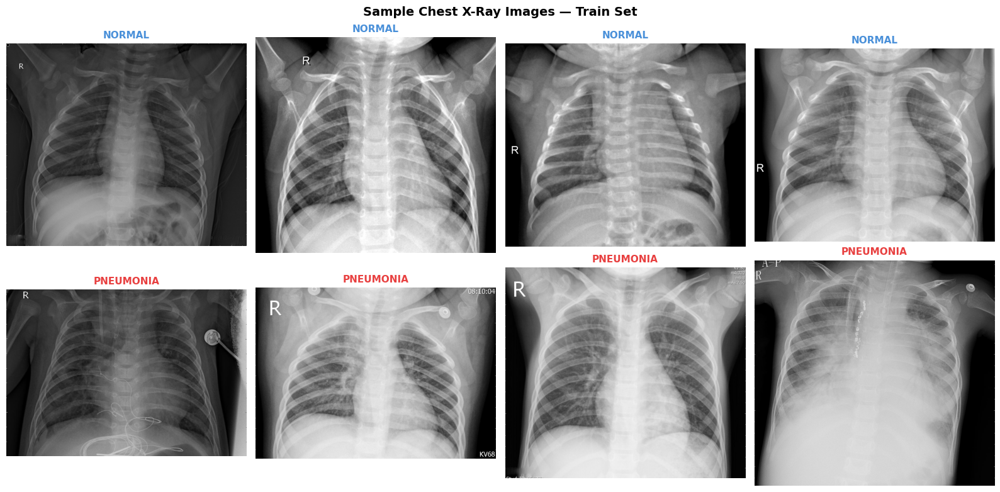

Saved: sample_images.pdf


In [5]:
# ── 2.3 Sample images → PDF ──────────────────────────────────────────────────
def load_samples(split, cls, n=4):
    folder = os.path.join(DATA_ROOT, split, cls)
    files  = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.jpeg','.png'))][:n]
    return [Image.open(os.path.join(folder, f)).convert('RGB') for f in files]

samples = {'NORMAL': load_samples('train','NORMAL'), 'PNEUMONIA': load_samples('train','PNEUMONIA')}
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Sample Chest X-Ray Images — Train Set', fontsize=14, fontweight='bold')
for row_idx, (cls, imgs) in enumerate(samples.items()):
    color = COLOR_N if cls == 'NORMAL' else COLOR_P
    for col_idx, img in enumerate(imgs):
        ax = axes[row_idx][col_idx]
        ax.imshow(img, cmap='gray'); ax.set_title(cls, fontsize=11, fontweight='bold', color=color)
        ax.axis('off')
plt.tight_layout()
fig.savefig('/kaggle/working/outputs/figures/sample_images.pdf', format='pdf', bbox_inches='tight', dpi=150)
plt.show(); print('Saved: sample_images.pdf')

In [6]:
# ── 2.4 Compute & save class weights (RQ3) ───────────────────────────────────
train_labels = []
for cls_idx, cls in enumerate(CLASSES):
    folder = os.path.join(DATA_ROOT, 'train', cls)
    train_labels.extend([cls_idx] * len(os.listdir(folder)))

train_labels = np.array(train_labels)
weights_arr  = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
CLASS_WEIGHTS = {int(i): float(w) for i, w in enumerate(weights_arr)}

with open('/kaggle/working/outputs/tables/class_weights.json', 'w') as f:
    json.dump(CLASS_WEIGHTS, f, indent=2)

print('Class weights (balanced):')
for idx, cls in enumerate(CLASSES):
    print(f'  {idx} ({cls}) → {CLASS_WEIGHTS[idx]:.4f}')

Class weights (balanced):
  0 (NORMAL) → 1.9448
  1 (PNEUMONIA) → 0.6730


---
# 3. Preprocessing & Data Augmentation (RQ6)

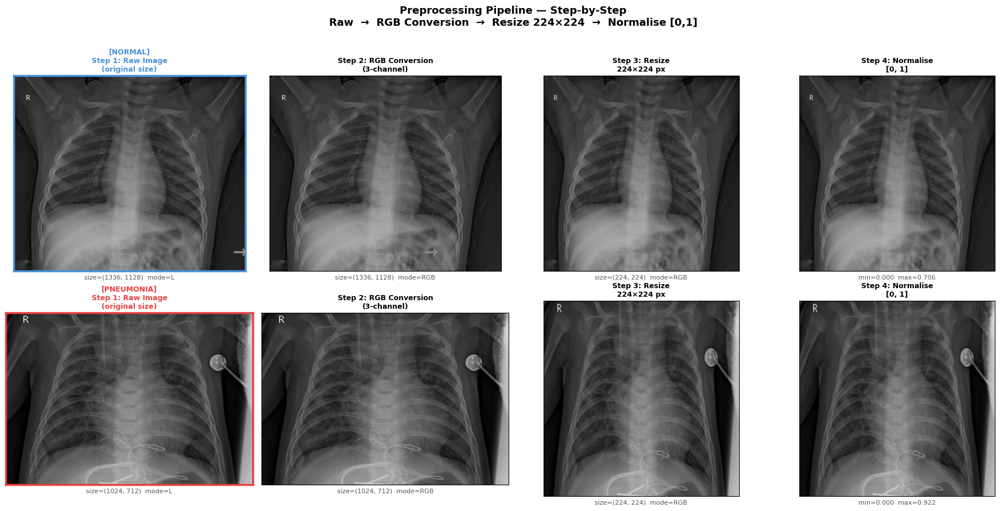

Saved: /kaggle/working/outputs/figures/preprocessing_pipeline.pdf

Preprocessing summary:
  1. Raw JPEG loaded from disk
  2. Converted to RGB (3-channel) — handles grayscale X-rays
  3. Resized to 224×224 px (standard CNN input size)
  4. Pixel values normalised to [0, 1] by dividing by 255
  5. For transfer learning: model-specific preprocess_input applied instead of step 4


In [7]:
# ── 3.0 Preprocessing pipeline — explicit step-by-step demonstration ─────────
# Shows each preprocessing step visually on one NORMAL and one PNEUMONIA sample.
# This satisfies: Dataset preprocessing + Image resizing and normalization requirements.

def preprocess_steps(img_path):
    """
    Returns a dict of intermediate images at each preprocessing step.
    Steps: Raw → RGB → Resize 224x224 → Normalize [0,1]
    """
    # Step 1: Load raw image
    raw = Image.open(img_path)

    # Step 2: Convert to RGB (ensure 3-channel)
    rgb = raw.convert('RGB')

    # Step 3: Resize to 224x224
    resized = rgb.resize(IMG_SIZE, Image.LANCZOS)

    # Step 4: Normalize to [0, 1]
    normalized = np.array(resized).astype(np.float32) / 255.0

    return {
        'Raw Image\n(original size)' : (raw, 'gray'),
        'RGB Conversion\n(3-channel)' : (rgb, 'gray'),
        f'Resize\n{IMG_SIZE[0]}×{IMG_SIZE[1]} px' : (resized, 'gray'),
        'Normalised\n[0, 1]'          : (normalized, None),
    }


# Pick one sample from each class
normal_sample    = os.path.join(DATA_ROOT, 'train', 'NORMAL',
    [f for f in os.listdir(os.path.join(DATA_ROOT,'train','NORMAL'))
     if f.lower().endswith(('.jpg','.jpeg'))][0])
pneumonia_sample = os.path.join(DATA_ROOT, 'train', 'PNEUMONIA',
    [f for f in os.listdir(os.path.join(DATA_ROOT,'train','PNEUMONIA'))
     if f.lower().endswith(('.jpeg','.jpg'))][0])

samples_pp = [
    ('NORMAL',    normal_sample,    COLOR_N),
    ('PNEUMONIA', pneumonia_sample, COLOR_P),
]

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
fig.suptitle(
    'Preprocessing Pipeline — Step-by-Step\n'
    'Raw  →  RGB Conversion  →  Resize 224×224  →  Normalise [0,1]',
    fontsize=13, fontweight='bold'
)

step_titles = [
    'Step 1: Raw Image\n(original size)',
    'Step 2: RGB Conversion\n(3-channel)',
    f'Step 3: Resize\n224×224 px',
    'Step 4: Normalise\n[0, 1]',
]

for row_idx, (cls_label, path, color) in enumerate(samples_pp):
    steps = preprocess_steps(path)

    for col_idx, (step_key, (img_data, cmap)) in enumerate(steps.items()):
        ax = axes[row_idx][col_idx]

        if isinstance(img_data, np.ndarray):
            ax.imshow(img_data, cmap=cmap)
            # Show pixel value range
            ax.set_xlabel(f'min={img_data.min():.3f}  max={img_data.max():.3f}',
                          fontsize=8, color='#555')
        else:
            arr = np.array(img_data)
            ax.imshow(arr, cmap=cmap)
            ax.set_xlabel(f'size={img_data.size}  mode={img_data.mode}',
                          fontsize=8, color='#555')

        title = step_titles[col_idx]
        if col_idx == 0:
            title = f'[{cls_label}]\n' + title
        ax.set_title(title, fontsize=9, fontweight='bold',
                     color=color if col_idx == 0 else 'black')
        ax.set_xticks([]); ax.set_yticks([])

        # Draw colored border for class label column
        if col_idx == 0:
            for spine in ax.spines.values():
                spine.set_edgecolor(color); spine.set_linewidth(2.5)

# Add step arrows between columns
for col in range(3):
    fig.text(
        0.235 + col * 0.185, 0.5, '→',
        ha='center', va='center', fontsize=22, color='#888', fontweight='bold'
    )

plt.tight_layout(rect=[0, 0, 1, 0.95])
p = '/kaggle/working/outputs/figures/preprocessing_pipeline.pdf'
fig.savefig(p, format='pdf', bbox_inches='tight', dpi=150)
plt.show()
print(f'Saved: {p}')
print()
print('Preprocessing summary:')
print('  1. Raw JPEG loaded from disk')
print('  2. Converted to RGB (3-channel) — handles grayscale X-rays')
print('  3. Resized to 224×224 px (standard CNN input size)')
print('  4. Pixel values normalised to [0, 1] by dividing by 255')
print('  5. For transfer learning: model-specific preprocess_input applied instead of step 4')


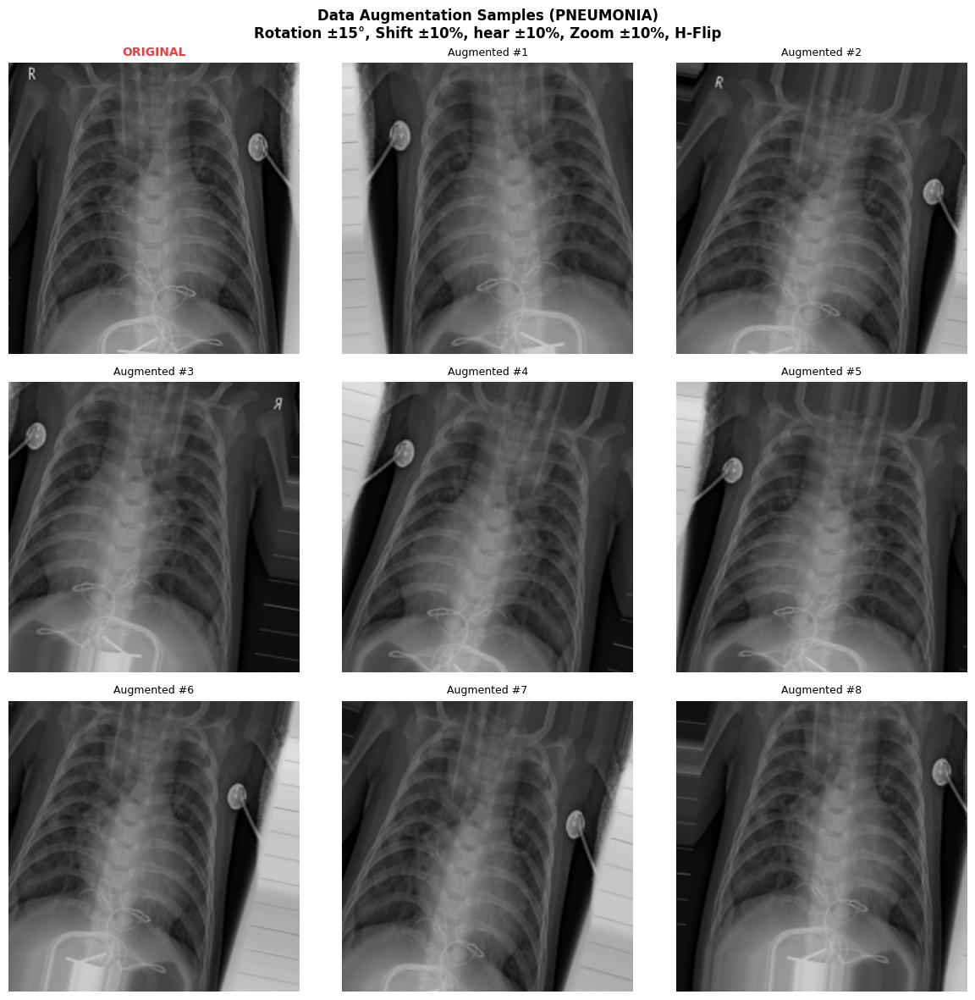

Saved: augmentation_samples.pdf


In [8]:
# ── 3.1 Augmentation visualisation → PDF ─────────────────────────────────────
# Show one original image + 8 augmented versions
aug_gen_vis = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1, height_shift_range=0.1,
    shear_range=0.1, zoom_range=0.1,
    horizontal_flip=True, fill_mode='nearest'
)

sample_folder = os.path.join(DATA_ROOT, 'train', 'PNEUMONIA')
sample_file   = [f for f in os.listdir(sample_folder) if f.endswith('.jpeg')][0]
original = np.array(Image.open(os.path.join(sample_folder, sample_file)).convert('RGB').resize(IMG_SIZE)).astype(np.float32) / 255.0
img_4d   = original.reshape((1,) + original.shape)
aug_flow = aug_gen_vis.flow(img_4d, batch_size=1, seed=SEED)
aug_imgs = [np.clip(next(aug_flow)[0], 0, 1) for _ in range(8)]

fig, axes = plt.subplots(3, 3, figsize=(12, 12))
fig.suptitle('Data Augmentation Samples (PNEUMONIA)\nRotation ±15°, Shift ±10%, hear ±10%, Zoom ±10%, H-Flip',
             fontsize=12, fontweight='bold') 
axes[0][0].imshow(original)
axes[0][0].set_title('ORIGINAL', fontsize=10, fontweight='bold', color=COLOR_P)
axes[0][0].axis('off')
for idx, aug in enumerate(aug_imgs):
    r, c = divmod(idx+1, 3)
    axes[r][c].imshow(aug)
    axes[r][c].set_title(f'Augmented #{idx+1}', fontsize=9)
    axes[r][c].axis('off')
plt.tight_layout()
fig.savefig('/kaggle/working/outputs/figures/augmentation_samples.pdf', format='pdf', bbox_inches='tight', dpi=150)
plt.show()
print('Saved: augmentation_samples.pdf')

In [9]:
# ── 3.2 Generator factory ────────────────────────────────────────────────────
# Train: augmentation + preprocess | Val: preprocess only | Test: preprocess only
# Val uses 20% split from train folder — the original val folder (16 images) is ignored.

def make_generators(preprocess_fn=None):
    """
    Returns (train_gen, val_gen, test_gen).
    preprocess_fn=None  → rescale 1/255 (Custom CNN)
    preprocess_fn=fn    → model-specific preprocessing (EfficientNet, ResNet)
    """
    common = dict(preprocessing_function=preprocess_fn) if preprocess_fn \
             else dict(rescale=1./255)

    train_dg = ImageDataGenerator(
        **common,
        rotation_range=15,
        width_shift_range=0.1, height_shift_range=0.1,
        shear_range=0.1, zoom_range=0.1,
        horizontal_flip=True, fill_mode='nearest',
        validation_split=VAL_SPLIT
    )
    val_dg = ImageDataGenerator(**common, validation_split=VAL_SPLIT)
    test_dg = ImageDataGenerator(**common)

    tg = train_dg.flow_from_directory(
        os.path.join(DATA_ROOT,'train'), target_size=IMG_SIZE,
        batch_size=BATCH_SIZE, class_mode='binary',
        subset='training', seed=SEED, shuffle=True)

    vg = val_dg.flow_from_directory(
        os.path.join(DATA_ROOT,'train'), target_size=IMG_SIZE,
        batch_size=BATCH_SIZE, class_mode='binary',
        subset='validation', seed=SEED, shuffle=False)

    tst = test_dg.flow_from_directory(
        os.path.join(DATA_ROOT,'test'), target_size=IMG_SIZE,
        batch_size=BATCH_SIZE, class_mode='binary',
        seed=SEED, shuffle=False)

    print(f'  Train:{tg.samples}  Val:{vg.samples}  Test:{tst.samples}')
    return tg, vg, tst

print('Generator factory defined.')

Generator factory defined.


---
# 4. Custom CNN — Training & Evaluation (RQ1, RQ3, RQ4)

In [10]:
# ── 4.1 Model architecture ───────────────────────────────────────────────────
def build_custom_cnn():
    """4-block custom CNN for binary chest X-ray classification."""
    inputs = keras.Input(shape=(224,224,3))
    x = layers.Conv2D(32,3,padding='same',activation='relu',kernel_regularizer=regularizers.l2(1e-4))(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(32,3,padding='same',activation='relu')(x)
    x = layers.MaxPooling2D(2)(x); x = layers.Dropout(0.25)(x)

    x = layers.Conv2D(64,3,padding='same',activation='relu',kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(64,3,padding='same',activation='relu')(x)
    x = layers.MaxPooling2D(2)(x); x = layers.Dropout(0.25)(x)

    x = layers.Conv2D(128,3,padding='same',activation='relu',kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(128,3,padding='same',activation='relu')(x)
    x = layers.MaxPooling2D(2)(x); x = layers.Dropout(0.30)(x)

    x = layers.Conv2D(256,3,padding='same',activation='relu',kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D(2)(x); x = layers.Dropout(0.30)(x)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256,activation='relu',kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.50)(x)
    outputs = layers.Dense(1,activation='sigmoid')(x)
    return keras.Model(inputs, outputs, name='CustomCNN')

cnn_model = build_custom_cnn()
cnn_model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy',
             keras.metrics.Precision(name='precision'),
             keras.metrics.Recall(name='recall'),
             keras.metrics.AUC(name='auc')])
cnn_model.summary()

I0000 00:00:1782250454.491788      58 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1782250454.498044      58 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "CustomCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 650,145 (2.48 MB)

 Trainable params: 649,185 (2.48 MB)

 Non-trainable params: 960 (3.75 KB)

In [11]:
# ── 4.2 Training ─────────────────────────────────────────────────────────────
cnn_tg, cnn_vg, cnn_test = make_generators(preprocess_fn=None)

cnn_history = cnn_model.fit(
    cnn_tg, epochs=EPOCHS, validation_data=cnn_vg,
    class_weight=CLASS_WEIGHTS,
    callbacks=[
        EarlyStopping(monitor='val_auc', mode='max', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint('/kaggle/working/outputs/models/custom_cnn.keras',
                        monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ], verbose=1)

df_cnn_hist = pd.DataFrame(cnn_history.history)
df_cnn_hist.to_csv('/kaggle/working/outputs/tables/training_history_cnn.csv')
display(df_cnn_hist)
print('Training complete.')

Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
  Train:4173  Val:1043  Test:624
Epoch 1/20


I0000 00:00:1782250467.888219     148 service.cc:152] XLA service 0x7a92e8107e60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1782250467.888276     148 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1782250467.888282     148 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1782250468.920525     148 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-06-23 21:34:35.088680: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 21:34:35.243441: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 21:34:38.272441: E external/local_xl

  1/131 ━━━━━━━━━━━━━━━━━━━━ 57:55 27s/step - accuracy: 0.4062 - auc: 0.5057 - loss: 0.6920 - precision: 0.9167 - recall: 0.3793

I0000 00:00:1782250489.376338     148 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


 49/131 ━━━━━━━━━━━━━━━━━━━━ 59s 720ms/step - accuracy: 0.6878 - auc: 0.7241 - loss: 0.7384 - precision: 0.8829 - recall: 0.6828

2026-06-23 21:35:27.918676: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 21:35:28.068501: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 21:35:29.475347: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 21:35:29.761130: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 800ms/step - accuracy: 0.7635 - auc: 0.8304 - loss: 0.5669 - precision: 0.9226 - recall: 0.7487
Epoch 1: val_auc improved from None to 0.50000, saving model to /kaggle/working/outputs/models/custom_cnn.keras

Epoch 1: finished saving model to /kaggle/working/outputs/models/custom_cnn.keras
131/131 ━━━━━━━━━━━━━━━━━━━━ 153s 974ms/step - accuracy: 0.8363 - auc: 0.9188 - loss: 0.4143 - precision: 0.9569 - recall: 0.8165 - val_accuracy: 0.7430 - val_auc: 0.5000 - val_loss: 3.8701 - val_precision: 0.7430 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 2/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 585ms/step - accuracy: 0.8888 - auc: 0.9562 - loss: 0.3168 - precision: 0.9718 - recall: 0.8735
Epoch 2: val_auc did not improve from 0.50000
131/131 ━━━━━━━━━━━━━━━━━━━━ 86s 657ms/step - accuracy: 0.8960 - auc: 0.9599 - loss: 0.2990 - precision: 0.9764 - recall: 0.8813 - val_accuracy: 0.7430 - val_auc: 0.5000 - val_loss: 6.0589 - val_precision: 0.7430 - val_recall: 1.0000

,accuracy,auc,loss,precision,recall,val_accuracy,val_auc,val_loss,val_precision,val_recall,learning_rate
0,0.836329,0.918760,0.414268,0.956900,0.816452,0.743049,0.500000,3.870088,0.743049,1.000000,0.001000
1,0.895998,0.959931,0.298973,0.976412,0.881290,0.743049,0.500000,6.058931,0.743049,1.000000,0.001000
2,0.904385,0.967984,0.270625,0.976031,0.893226,0.743049,0.500000,4.789610,0.743049,1.000000,0.001000
3,0.913491,0.973274,0.253068,0.980358,0.901613,0.743049,0.500000,3.327873,0.743049,1.000000,0.001000
4,0.922837,0.977911,0.231647,0.977977,0.916774,0.828380,0.959637,0.517227,0.986928,0.779355,0.001000
5,0.929307,0.980801,0.214407,0.981462,0.922258,0.277085,0.779596,3.454708,1.000000,0.027097,0.001000
6,0.934340,0.983002,0.199635,0.982912,0.927742,0.812081,0.851637,0.611709,0.893878,0.847742,0.001000
7,0.941050,0.985613,0.190009,0.983729,0.936129,0.712368,0.882564,0.761660,0.957611,0.641290,0.001000
8,0.941289,0.987083,0.177584,0.986703,0.933548,0.924257,0.993021,0.208448,0.997143,0.900645,0.000500
9,0.954230,0.989077,0.163145,0.989896,0.948065,0.752637,0.978599,0.579330,0.996161,0.669677,0.000500


Training complete.


In [12]:
# ── 4.3 Shared evaluation helpers ────────────────────────────────────────────
def plot_training_curves(df_hist, title, out_path):
    fig, axes = plt.subplots(1, 2, figsize=(12,5))
    fig.suptitle(title, fontsize=14, fontweight='bold')
    for ax, (tr,vl,label) in zip(axes,
        [('accuracy','val_accuracy','Accuracy'),('loss','val_loss','Loss')]):
        ax.plot(df_hist[tr], label=f'Train {label}', color='#4A90D9')
        ax.plot(df_hist[vl], label=f'Val {label}',   color='#E84040', linestyle='--')
        ax.set_xlabel('Epoch'); ax.set_ylabel(label)
        ax.set_title(label); ax.legend()
        ax.grid(linestyle='--',alpha=0.4); ax.spines[['top','right']].set_visible(False)
    plt.tight_layout()
    fig.savefig(out_path, format='pdf', bbox_inches='tight', dpi=150)
    plt.show(); print(f'Saved: {out_path}')

def plot_confusion_matrix(y_true, y_pred, title, out_path):
    cm = confusion_matrix(y_true, y_pred)
    tn,fp,fn,tp = cm.ravel()
    fig, ax = plt.subplots(figsize=(7,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=CLASSES, yticklabels=CLASSES,
                linewidths=0.5, ax=ax, annot_kws={'size':14})
    ax.set_xlabel('Predicted Label',fontsize=12); ax.set_ylabel('True Label',fontsize=12)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.text(1.05,0.5,
            f'TN={tn}  FP={fp}\nFN={fn}  TP={tp}\n\nSensitivity={tp/(tp+fn):.3f}\nSpecificity={tn/(tn+fp):.3f}',
            transform=ax.transAxes, fontsize=10, va='center',
            bbox=dict(boxstyle='round',facecolor='#E8F4FD',edgecolor='#4A90D9'))
    plt.tight_layout()
    fig.savefig(out_path, format='pdf', bbox_inches='tight', dpi=150)
    plt.show(); print(f'Saved: {out_path}')

def plot_roc(y_true, y_prob, title, out_path):
    fpr,tpr,_ = roc_curve(y_true, y_prob)
    roc_auc   = auc(fpr, tpr)
    fig, ax   = plt.subplots(figsize=(7,6))
    ax.plot(fpr,tpr,color='#E84040',lw=2,label=f'ROC (AUC={roc_auc:.4f})')
    ax.plot([0,1],[0,1],color='grey',linestyle='--',lw=1)
    ax.set_xlabel('False Positive Rate',fontsize=12); ax.set_ylabel('True Positive Rate',fontsize=12)
    ax.set_title(title,fontsize=13,fontweight='bold')
    ax.legend(fontsize=11); ax.grid(linestyle='--',alpha=0.4)
    ax.spines[['top','right']].set_visible(False)
    plt.tight_layout()
    fig.savefig(out_path, format='pdf', bbox_inches='tight', dpi=150)
    plt.show(); print(f'Saved: {out_path}')
    return roc_auc, fpr, tpr

def save_report(y_true, y_pred, y_prob, model_name):
    fpr,tpr,_ = roc_curve(y_true, y_prob)
    roc_auc   = auc(fpr, tpr)
    report    = classification_report(y_true, y_pred, target_names=CLASSES, output_dict=True)
    df        = pd.DataFrame(report).transpose()
    df.loc['AUC-ROC'] = [roc_auc, np.nan, np.nan, np.nan]
    path = f'/kaggle/working/outputs/tables/classification_report_{model_name}.csv'
    df.to_csv(path); print(f'Saved: {path}')
    return df, roc_auc

print('Helpers defined.')

Helpers defined.


Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
  Train:4173  Val:1043  Test:624
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 421ms/step


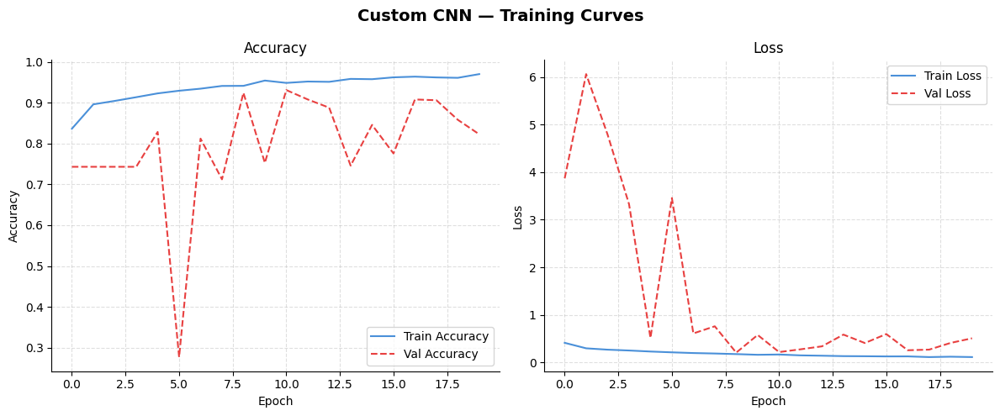

Saved: /kaggle/working/outputs/figures/training_curves_cnn.pdf


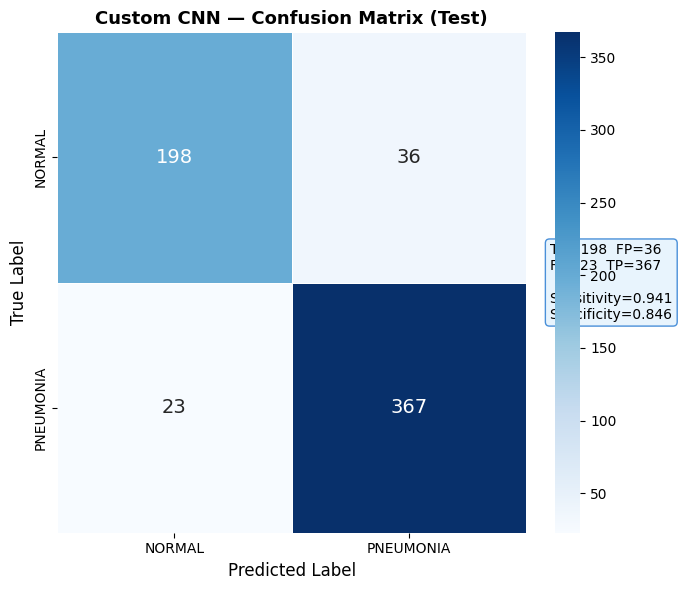

Saved: /kaggle/working/outputs/figures/confusion_matrix_cnn.pdf


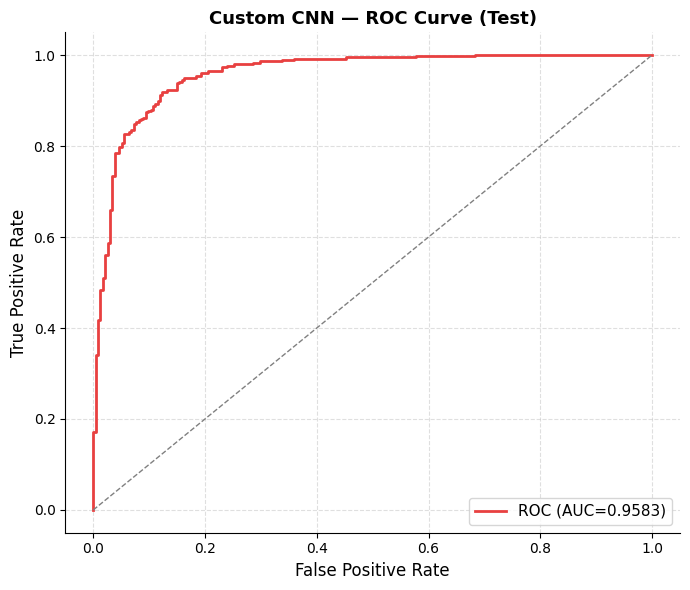

Saved: /kaggle/working/outputs/figures/roc_curve_cnn.pdf
Saved: /kaggle/working/outputs/tables/classification_report_cnn.csv


,precision,recall,f1-score,support
NORMAL,0.8959,0.8462,0.8703,234.0000
PNEUMONIA,0.9107,0.9410,0.9256,390.0000
accuracy,0.9054,0.9054,0.9054,0.9054
macro avg,0.9033,0.8936,0.8980,624.0000
weighted avg,0.9051,0.9054,0.9049,624.0000
AUC-ROC,0.9583,NaN,NaN,NaN


In [13]:
# ── 4.4 Custom CNN evaluation ─────────────────────────────────────────────────
_, _, cnn_test = make_generators(preprocess_fn=None)
cnn_prob = cnn_model.predict(cnn_test, verbose=1).flatten()
cnn_pred = (cnn_prob >= 0.5).astype(int)
y_true   = cnn_test.classes

plot_training_curves(df_cnn_hist, 'Custom CNN — Training Curves',
    '/kaggle/working/outputs/figures/training_curves_cnn.pdf')
plot_confusion_matrix(y_true, cnn_pred, 'Custom CNN — Confusion Matrix (Test)',
    '/kaggle/working/outputs/figures/confusion_matrix_cnn.pdf')
cnn_auc, cnn_fpr, cnn_tpr = plot_roc(y_true, cnn_prob, 'Custom CNN — ROC Curve (Test)',
    '/kaggle/working/outputs/figures/roc_curve_cnn.pdf')
df_cnn_report, _ = save_report(y_true, cnn_pred, cnn_prob, 'cnn')
display(df_cnn_report.round(4))

---
# 5. Transfer Learning — EfficientNetB0 & ResNet50 (RQ2, RQ3, RQ4)

In [14]:
# ── 5.1 Transfer learning helpers ────────────────────────────────────────────
def build_transfer_model(base_model, name):
    base_model.trainable = False
    inputs  = keras.Input(shape=(224,224,3))
    x       = base_model(inputs, training=False)
    x       = layers.GlobalAveragePooling2D()(x)
    x       = layers.BatchNormalization()(x)
    x       = layers.Dense(256, activation='relu')(x)
    x       = layers.Dropout(0.55)(x)
    outputs = layers.Dense(1, activation='sigmoid')(x)
    model   = keras.Model(inputs, outputs, name=name)
    model.compile(
        optimizer=keras.optimizers.Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy',
                 keras.metrics.Precision(name='precision'),
                 keras.metrics.Recall(name='recall'),
                 keras.metrics.AUC(name='auc')])
    return model

def fine_tune(model, base_model, unfreeze_n, lr=1e-6):
    base_model.trainable = True
    for layer in base_model.layers[:-unfreeze_n]:
        layer.trainable = False
    model.compile(
        optimizer=keras.optimizers.Adam(lr),
        loss='binary_crossentropy',
        metrics=['accuracy',
                 keras.metrics.Precision(name='precision'),
                 keras.metrics.Recall(name='recall'),
                 keras.metrics.AUC(name='auc')])
    return model

def get_callbacks(model_name):
    return [
        EarlyStopping(monitor='val_auc', mode='max', patience=5, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1),
        ModelCheckpoint(f'/kaggle/working/outputs/models/{model_name}.keras',
                        monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

def merge_histories(h1, h2):
    return pd.DataFrame({k: h1.history[k] + h2.history.get(k,[]) for k in h1.history})

print('Transfer learning helpers defined.')

Transfer learning helpers defined.


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
EfficientNetB0 generators:
Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
  Train:4173  Val:1043  Test:624
Epoch 1/10


2026-06-23 22:04:29.805128: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:04:29.949368: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:04:30.306479: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:04:30.448367: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:04:31.286305: E external/local_xla/xla/stream_

105/131 ━━━━━━━━━━━━━━━━━━━━ 14s 565ms/step - accuracy: 0.8585 - auc: 0.9323 - loss: 0.3690 - precision: 0.9561 - recall: 0.8447

2026-06-23 22:05:45.080460: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:05:45.219908: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:05:45.545124: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:05:45.686472: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:05:46.486712: E external/local_xla/xla/stream_

131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 676ms/step - accuracy: 0.8669 - auc: 0.9386 - loss: 0.3471 - precision: 0.9588 - recall: 0.8545

2026-06-23 22:06:28.965725: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:06:29.107021: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:06:29.437210: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:06:29.578401: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:06:30.363513: E external/local_xla/xla/stream_


Epoch 1: val_auc improved from None to 0.98939, saving model to /kaggle/working/outputs/models/efficientnet.keras

Epoch 1: finished saving model to /kaggle/working/outputs/models/efficientnet.keras
131/131 ━━━━━━━━━━━━━━━━━━━━ 145s 893ms/step - accuracy: 0.9029 - auc: 0.9652 - loss: 0.2524 - precision: 0.9707 - recall: 0.8965 - val_accuracy: 0.9223 - val_auc: 0.9894 - val_loss: 0.1963 - val_precision: 0.9901 - val_recall: 0.9045 - learning_rate: 0.0010
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 560ms/step - accuracy: 0.9309 - auc: 0.9808 - loss: 0.1773 - precision: 0.9787 - recall: 0.9276
Epoch 2: val_auc did not improve from 0.98939
131/131 ━━━━━━━━━━━━━━━━━━━━ 83s 630ms/step - accuracy: 0.9360 - auc: 0.9822 - loss: 0.1711 - precision: 0.9816 - recall: 0.9313 - val_accuracy: 0.9118 - val_auc: 0.9860 - val_loss: 0.2122 - val_precision: 0.9942 - val_recall: 0.8865 - learning_rate: 0.0010
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 556ms/step - accuracy: 0.9401 - auc: 0.9838 - loss: 0.1

,accuracy,auc,loss,precision,recall,val_accuracy,val_auc,val_loss,val_precision,val_recall,learning_rate
0,0.902948,0.965184,0.252449,0.970660,0.896452,0.922339,0.989391,0.196342,0.990113,0.904516,0.00100
1,0.936017,0.982225,0.171098,0.981639,0.931290,0.911793,0.986021,0.212249,0.994211,0.886452,0.00100
2,0.940570,0.984798,0.155025,0.980458,0.938710,0.876318,0.992299,0.293603,0.998457,0.834839,0.00100
3,0.937934,0.985674,0.157092,0.980386,0.935161,0.903164,0.992646,0.229834,0.998521,0.870968,0.00100
4,0.950875,0.990230,0.122658,0.986555,0.946774,0.881112,0.993377,0.291114,0.998469,0.841290,0.00050
5,0.949677,0.989452,0.118955,0.986532,0.945161,0.924257,0.993515,0.178435,0.995726,0.901935,0.00050
6,0.954709,0.991246,0.111197,0.986301,0.952258,0.877277,0.991647,0.275817,0.993893,0.840000,0.00050
7,0.953750,0.991801,0.111685,0.985309,0.951935,0.866731,0.991471,0.333946,0.996875,0.823226,0.00050
8,0.950635,0.990371,0.118357,0.986878,0.946129,0.940556,0.993488,0.144783,0.994452,0.925161,0.00050
9,0.960939,0.991152,0.109094,0.990973,0.956129,0.911793,0.993818,0.210260,0.995646,0.885161,0.00050


Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
  Train:4173  Val:1043  Test:624
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step

2026-06-23 22:36:47.710740: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:36:47.851255: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:36:48.176721: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:36:48.318720: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-23 22:36:49.130203: E external/local_xla/xla/stream_

20/20 ━━━━━━━━━━━━━━━━━━━━ 24s 872ms/step


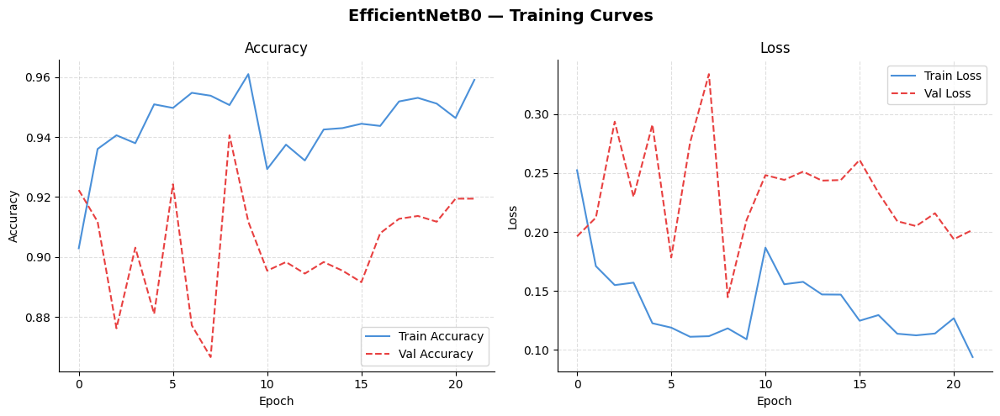

Saved: /kaggle/working/outputs/figures/training_curves_efficientnet.pdf


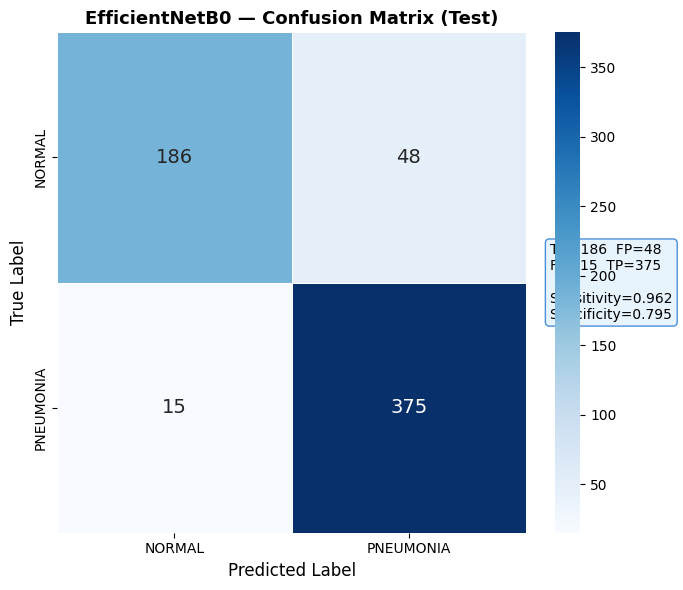

Saved: /kaggle/working/outputs/figures/confusion_matrix_efficientnet.pdf


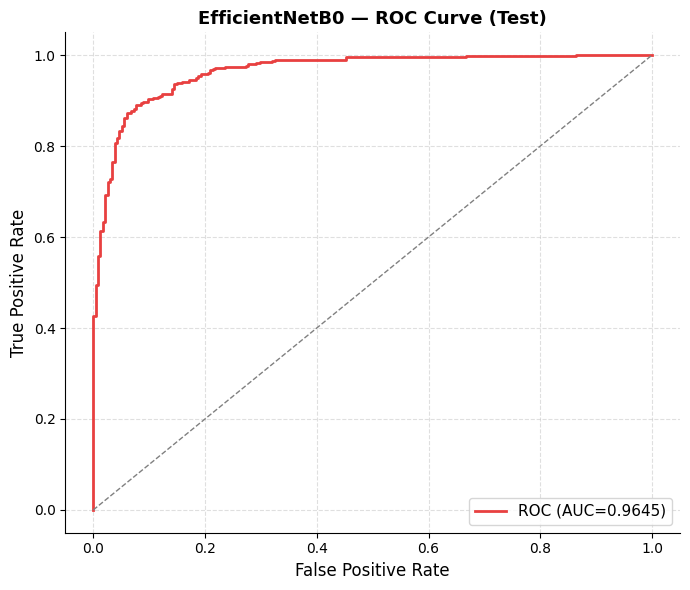

Saved: /kaggle/working/outputs/figures/roc_curve_efficientnet.pdf
Saved: /kaggle/working/outputs/tables/classification_report_efficientnet.csv


,precision,recall,f1-score,support
NORMAL,0.9254,0.7949,0.8552,234.000
PNEUMONIA,0.8865,0.9615,0.9225,390.000
accuracy,0.8990,0.8990,0.8990,0.899
macro avg,0.9059,0.8782,0.8888,624.000
weighted avg,0.9011,0.8990,0.8973,624.000
AUC-ROC,0.9645,NaN,NaN,NaN


In [15]:
# ── 5.2 EfficientNetB0 ───────────────────────────────────────────────────────
eff_base  = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224,224,3))
eff_model = build_transfer_model(eff_base, 'EfficientNetB0')

print('EfficientNetB0 generators:')
eff_tg, eff_vg, eff_test = make_generators(effnet_preprocess)

# Feature extraction
eff_h1 = eff_model.fit(eff_tg, epochs=10, validation_data=eff_vg,
    class_weight=CLASS_WEIGHTS, callbacks=get_callbacks('efficientnet'), verbose=1)

# Fine-tuning
eff_model = fine_tune(eff_model, eff_base, unfreeze_n=30, lr=1e-5)
eff_tg, eff_vg, eff_test = make_generators(effnet_preprocess)
eff_h2 = eff_model.fit(eff_tg, epochs=12, validation_data=eff_vg,
    class_weight=CLASS_WEIGHTS, callbacks=get_callbacks('efficientnet'), verbose=1)

df_eff_hist = merge_histories(eff_h1, eff_h2)
df_eff_hist.to_csv('/kaggle/working/outputs/tables/training_history_efficientnet.csv')
display(df_eff_hist)

_, _, eff_test = make_generators(effnet_preprocess)
eff_prob = eff_model.predict(eff_test, verbose=1).flatten()
eff_pred = (eff_prob >= 0.5).astype(int)

plot_training_curves(df_eff_hist, 'EfficientNetB0 — Training Curves',
    '/kaggle/working/outputs/figures/training_curves_efficientnet.pdf')
plot_confusion_matrix(y_true, eff_pred, 'EfficientNetB0 — Confusion Matrix (Test)',
    '/kaggle/working/outputs/figures/confusion_matrix_efficientnet.pdf')
eff_auc, eff_fpr, eff_tpr = plot_roc(y_true, eff_prob, 'EfficientNetB0 — ROC Curve (Test)',
    '/kaggle/working/outputs/figures/roc_curve_efficientnet.pdf')
df_eff_report, _ = save_report(y_true, eff_pred, eff_prob, 'efficientnet')
display(df_eff_report.round(4))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
ResNet50 generators:
Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
  Train:4173  Val:1043  Test:624
Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 604ms/step - accuracy: 0.8976 - auc: 0.9534 - loss: 0.2996 - precision: 0.9650 - recall: 0.8953
Epoch 1: val_auc improved from None to 0.99714, saving model to /kaggle/working/outputs/models/resnet50.keras

Epoch 1: finished saving model to /kaggle/working/outputs/models/resnet50.keras
131/131 ━━━━━━━━━━━━━━━━━━━━ 115s 764ms/step - accuracy: 0.9264 - auc: 0.9769 - loss: 0.2119 - precision: 0.9774 - recall: 0.9223 - val_accuracy: 0.8552 - val_auc: 0.9971 - val_loss: 0.3388 - val_precision: 1.0000 - val_recall: 0.8052 - learning_rate: 0.0010
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - accuracy: 0.9521 - auc: 0.9910 - loss: 0.1199 - precision: 0.9859 - recall: 0.9492
Epoch 2: val_auc did not improve from 0.99

,accuracy,auc,loss,precision,recall,val_accuracy,val_auc,val_loss,val_precision,val_recall,learning_rate
0,0.926432,0.976909,0.211877,0.977436,0.922258,0.855225,0.997135,0.338848,1.000000,0.805161,0.001000
1,0.951354,0.988884,0.129935,0.986237,0.947742,0.922339,0.996136,0.198411,0.997135,0.898064,0.001000
2,0.954230,0.987513,0.141185,0.986292,0.951613,0.930968,0.992886,0.223151,1.000000,0.907097,0.001000
3,0.959262,0.990411,0.124096,0.986388,0.958387,0.878236,0.982143,0.443863,1.000000,0.836129,0.001000
4,0.965492,0.991781,0.102784,0.991030,0.962258,0.908917,0.993710,0.284412,1.000000,0.877419,0.001000
5,0.964774,0.994083,0.092675,0.991675,0.960645,0.923298,0.994032,0.224122,1.000000,0.896774,0.000500
6,0.948958,0.988962,0.126127,0.990819,0.940000,0.871524,0.992699,0.368552,1.000000,0.827097,0.000010
7,0.957345,0.991670,0.106420,0.990598,0.951613,0.898370,0.995159,0.268517,1.000000,0.863226,0.000010
8,0.960460,0.992875,0.105193,0.989004,0.957419,0.895494,0.993770,0.297895,1.000000,0.859355,0.000010
9,0.969566,0.995652,0.076121,0.993362,0.965484,0.890700,0.992992,0.324033,1.000000,0.852903,0.000010


Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
  Train:4173  Val:1043  Test:624
20/20 ━━━━━━━━━━━━━━━━━━━━ 14s 520ms/step


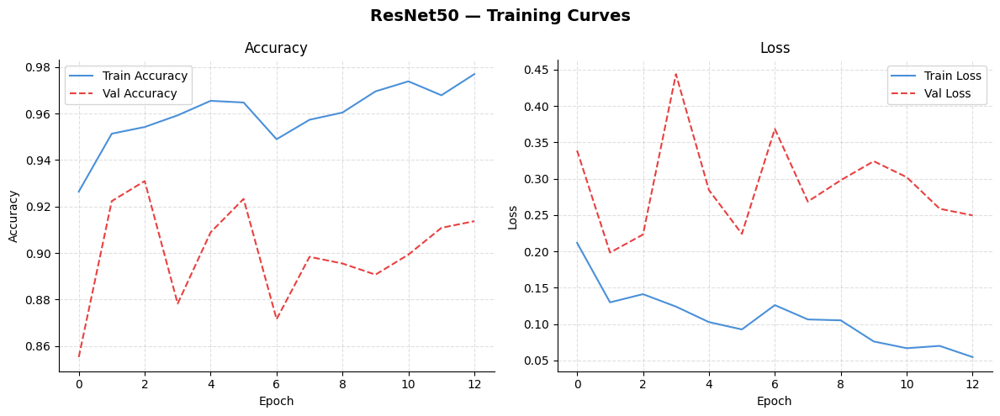

Saved: /kaggle/working/outputs/figures/training_curves_resnet50.pdf


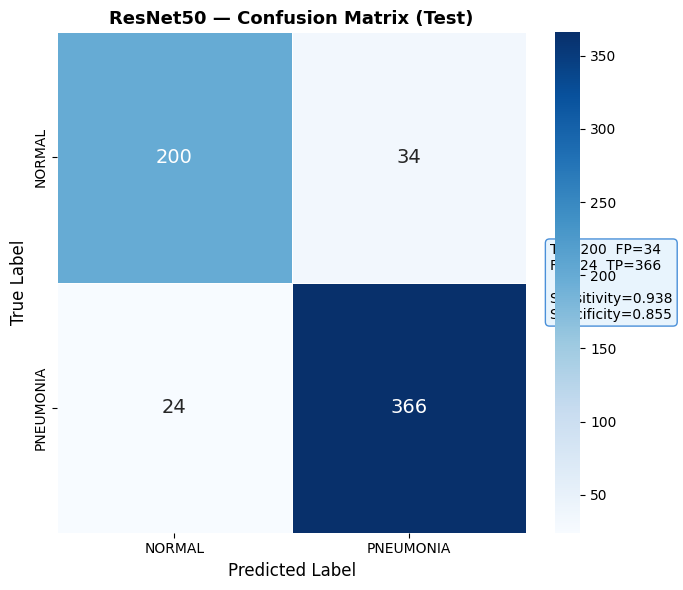

Saved: /kaggle/working/outputs/figures/confusion_matrix_resnet50.pdf


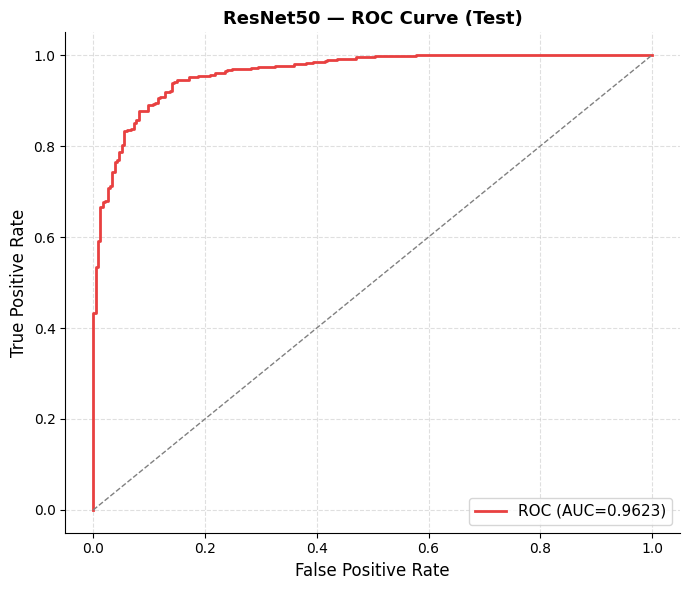

Saved: /kaggle/working/outputs/figures/roc_curve_resnet50.pdf
Saved: /kaggle/working/outputs/tables/classification_report_resnet50.csv


,precision,recall,f1-score,support
NORMAL,0.8929,0.8547,0.8734,234.0000
PNEUMONIA,0.9150,0.9385,0.9266,390.0000
accuracy,0.9071,0.9071,0.9071,0.9071
macro avg,0.9039,0.8966,0.9000,624.0000
weighted avg,0.9067,0.9071,0.9066,624.0000
AUC-ROC,0.9623,NaN,NaN,NaN


In [16]:
# ── 5.3 ResNet50 ─────────────────────────────────────────────────────────────
res_base  = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))
res_model = build_transfer_model(res_base, 'ResNet50')

print('ResNet50 generators:')
res_tg, res_vg, res_test = make_generators(resnet_preprocess)

# Feature extraction
res_h1 = res_model.fit(res_tg, epochs=10, validation_data=res_vg,
    class_weight=CLASS_WEIGHTS, callbacks=get_callbacks('resnet50'), verbose=1)

# Fine-tuning
res_model = fine_tune(res_model, res_base, unfreeze_n=30, lr=1e-5)
res_tg, res_vg, res_test = make_generators(resnet_preprocess)
res_h2 = res_model.fit(res_tg, epochs=12, validation_data=res_vg,
    class_weight=CLASS_WEIGHTS, callbacks=get_callbacks('resnet50'), verbose=1)

df_res_hist = merge_histories(res_h1, res_h2)
df_res_hist.to_csv('/kaggle/working/outputs/tables/training_history_resnet50.csv')
display(df_res_hist)

_, _, res_test = make_generators(resnet_preprocess)
res_prob = res_model.predict(res_test, verbose=1).flatten()
res_pred = (res_prob >= 0.5).astype(int)

plot_training_curves(df_res_hist, 'ResNet50 — Training Curves',
    '/kaggle/working/outputs/figures/training_curves_resnet50.pdf')
plot_confusion_matrix(y_true, res_pred, 'ResNet50 — Confusion Matrix (Test)',
    '/kaggle/working/outputs/figures/confusion_matrix_resnet50.pdf')
res_auc, res_fpr, res_tpr = plot_roc(y_true, res_prob, 'ResNet50 — ROC Curve (Test)',
    '/kaggle/working/outputs/figures/roc_curve_resnet50.pdf')
df_res_report, _ = save_report(y_true, res_pred, res_prob, 'resnet50')
display(df_res_report.round(4))

---
# 6. Grad-CAM Explainability (RQ5)

In [17]:
# ── 6.1 Grad-CAM classes ─────────────────────────────────────────────────────
# GradCAM class for Custom CNN
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.is_nested, self.grad_model = self._build_grad_model(model)

    @staticmethod
    def _last_conv_name(layer_list):
        for layer in reversed(layer_list):
            if isinstance(layer, tf.keras.layers.Conv2D):
                return layer.name
        return None

    @classmethod
    def _build_grad_model(cls, outer_model):
        for layer in outer_model.layers:
            if hasattr(layer, 'layers') and len(layer.layers) > 5:
                inner   = layer
                conv_nm = cls._last_conv_name(inner.layers)
                if conv_nm is None: continue
                grad_model = keras.Model(
                    inputs=inner.input,
                    outputs=[inner.get_layer(conv_nm).output, inner.output])
                print(f'  GradCAM nested: {inner.name} → {conv_nm}')
                return True, grad_model
        conv_nm = cls._last_conv_name(outer_model.layers)
        grad_model = keras.Model(
            inputs=outer_model.inputs,
            outputs=[outer_model.get_layer(conv_nm).output, outer_model.output])
        print(f'  GradCAM flat → {conv_nm}')
        return False, grad_model

    def compute_heatmap(self, img_array):
        img_tensor = tf.cast(img_array, tf.float32)
        try:
            if self.is_nested:
                with tf.GradientTape() as tape:
                    conv_out, _ = self.grad_model(img_tensor, training=False)
                    tape.watch(conv_out)
                    preds = self.model(img_tensor, training=False)
                    loss  = preds[:, 0]
                grads = tape.gradient(loss, conv_out)
            else:
                with tf.GradientTape() as tape:
                    conv_out, preds = self.grad_model(img_tensor, training=False)
                    tape.watch(conv_out)
                    loss = preds[:, 0]
                grads = tape.gradient(loss, conv_out)
        except Exception as e:
            print(f'  GradCAM failed: {e}'); return np.zeros(IMG_SIZE, dtype=np.float32)
        if grads is None:
            print('  Gradients None — blank heatmap.'); return np.zeros(IMG_SIZE, dtype=np.float32)
        pooled  = tf.reduce_mean(grads, axis=(0,1,2))
        heatmap = tf.reduce_sum(conv_out[0] * pooled, axis=-1).numpy()
        heatmap = np.maximum(heatmap, 0)
        if heatmap.max() > 0: heatmap /= heatmap.max()
        return heatmap

    @staticmethod
    def overlay(img_pil, heatmap, alpha=0.4):
        img_np    = np.array(img_pil.resize(IMG_SIZE))
        heatmap_r = cv2.resize(heatmap, IMG_SIZE)
        colored   = cv2.applyColorMap(np.uint8(255*heatmap_r), cv2.COLORMAP_JET)
        colored   = cv2.cvtColor(colored, cv2.COLOR_BGR2RGB)
        return np.clip(colored*alpha + img_np*(1-alpha), 0, 255).astype(np.uint8)

# Another GrandCAM class for the EfficientNETB0 & RestNET50

class GradCAMTransfer:
    def __init__(self, model, base_model, target_layer_name):
        self.model = model
        self.base_model = base_model
        self.target_layer_name = target_layer_name

        self.backbone_grad_model = keras.Model(
            inputs=base_model.input,
            outputs=[
                base_model.get_layer(target_layer_name).output,
                base_model.output
            ]
        )
        print(f'GradCAMTransfer → {base_model.name} / {target_layer_name}')

    def _classifier_head(self, backbone_output):
        x = backbone_output
        start = False

        for layer in self.model.layers:
            if layer is self.base_model:
                start = True
                continue

            if start:
                if isinstance(layer, tf.keras.layers.Dropout):
                    x = layer(x, training=False)
                else:
                    x = layer(x)

        return x

    def compute_heatmap(self, img_array):
        img_tensor = tf.cast(img_array, tf.float32)

        with tf.GradientTape() as tape:
            conv_out, backbone_out = self.backbone_grad_model(img_tensor, training=False)
            tape.watch(conv_out)
            preds = self._classifier_head(backbone_out)
            loss = preds[:, 0]

        grads = tape.gradient(loss, conv_out)

        if grads is None:
            print('Gradients None — blank heatmap.')
            return np.zeros(IMG_SIZE, dtype=np.float32)

        pooled = tf.reduce_mean(grads, axis=(0, 1, 2))
        heatmap = tf.reduce_sum(conv_out[0] * pooled, axis=-1)
        heatmap = tf.maximum(heatmap, 0)

        if tf.reduce_max(heatmap) > 0:
            heatmap = heatmap / tf.reduce_max(heatmap)

        return heatmap.numpy()

    @staticmethod
    def overlay(img_pil, heatmap, alpha=0.30):
        img_np = np.array(img_pil.resize(IMG_SIZE))
        heatmap_r = cv2.resize(heatmap, IMG_SIZE)
        colored = cv2.applyColorMap(np.uint8(255 * heatmap_r), cv2.COLORMAP_JET)
        colored = cv2.cvtColor(colored, cv2.COLOR_BGR2RGB)
        return np.clip(colored * alpha + img_np * (1 - alpha), 0, 255).astype(np.uint8)

gradcam_cnn = GradCAM(cnn_model)
gradcam_eff = GradCAMTransfer(eff_model, eff_base, target_layer_name='top_activation')
gradcam_res = GradCAMTransfer(res_model, res_base, target_layer_name='conv5_block3_2_relu')
print('Grad-CAM objects ready.')

  GradCAM flat → conv2d_6
GradCAMTransfer → efficientnetb0 / top_activation
GradCAMTransfer → resnet50 / conv5_block3_2_relu
Grad-CAM objects ready.


In [18]:
# ── 6.2 Sample selection & preprocessing ─────────────────────────────────────
def pick_samples(cls, n=4):
    folder = os.path.join(DATA_ROOT, 'test', cls)
    files  = sorted([f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.jpeg'))])
    return [os.path.join(folder, f) for f in files[:n]]

def load_for_cnn(path):
    img = Image.open(path).convert('RGB')
    arr = np.array(img.resize(IMG_SIZE)).astype(np.float32) / 255.0
    return img, arr[np.newaxis]

def load_for_eff(path):
    img = Image.open(path).convert('RGB')
    arr = effnet_preprocess(np.array(img.resize(IMG_SIZE)).astype(np.float32))
    return img, arr[np.newaxis]

def load_for_res(path):
    img = Image.open(path).convert('RGB')
    arr = resnet_preprocess(np.array(img.resize(IMG_SIZE)).astype(np.float32))
    return img, arr[np.newaxis]

normal_paths    = pick_samples('NORMAL',    n=4)
pneumonia_paths = pick_samples('PNEUMONIA', n=4)
print(f'Samples: {len(normal_paths)} NORMAL, {len(pneumonia_paths)} PNEUMONIA')

Samples: 4 NORMAL, 4 PNEUMONIA


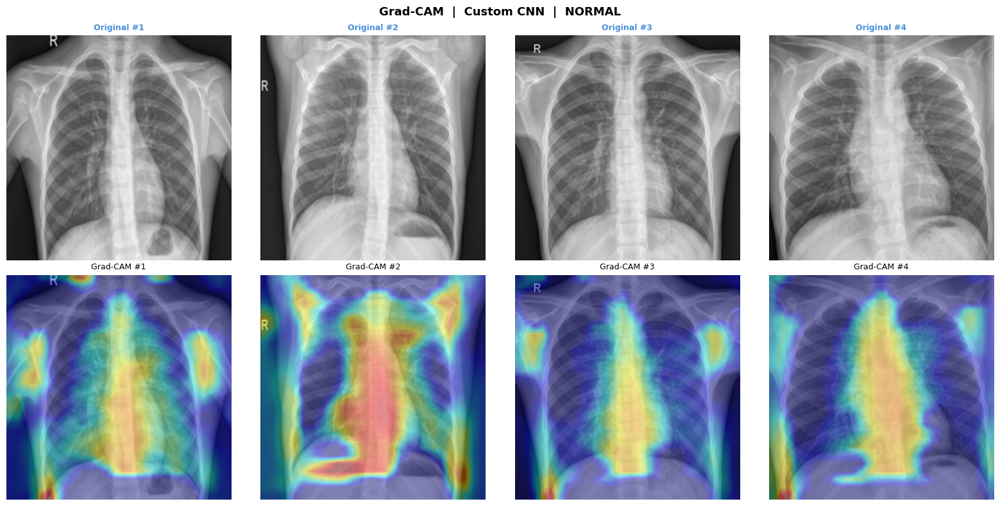

Saved: /kaggle/working/outputs/figures/gradcam_cnn_normal.pdf


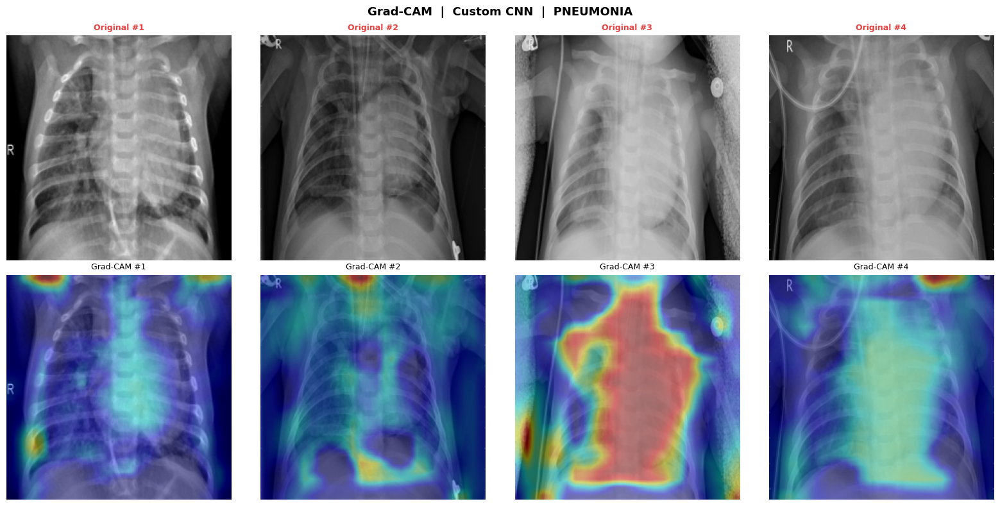

Saved: /kaggle/working/outputs/figures/gradcam_cnn_pneumonia.pdf


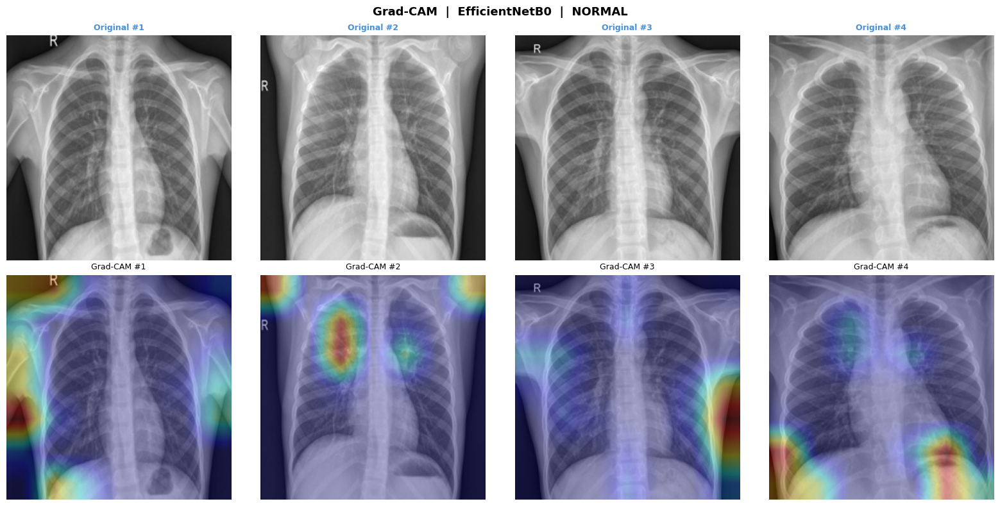

Saved: /kaggle/working/outputs/figures/gradcam_efficientnet_normal.pdf


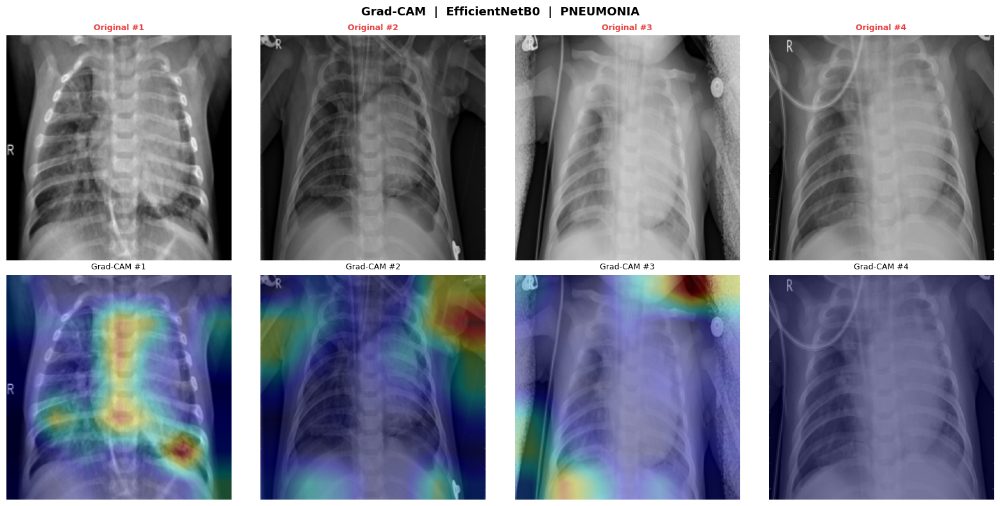

Saved: /kaggle/working/outputs/figures/gradcam_efficientnet_pneumonia.pdf


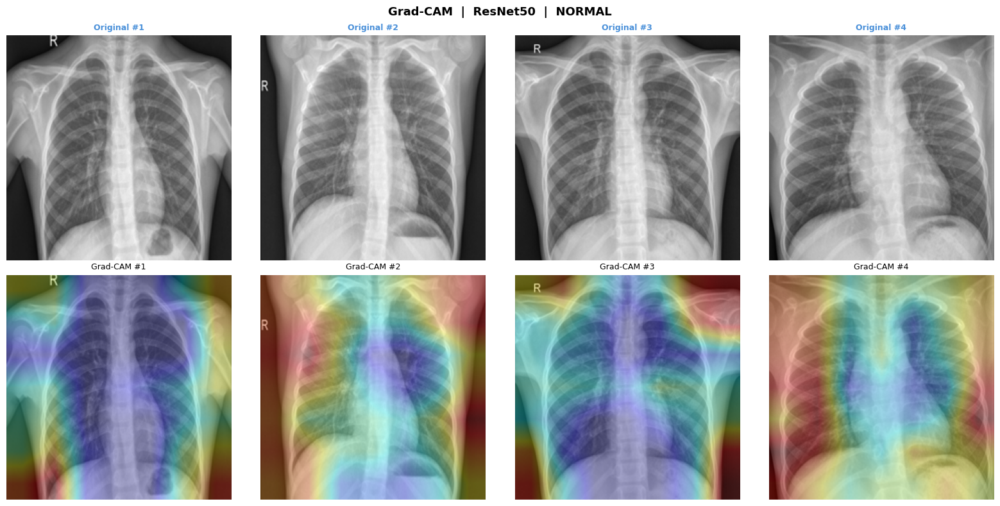

Saved: /kaggle/working/outputs/figures/gradcam_resnet50_normal.pdf


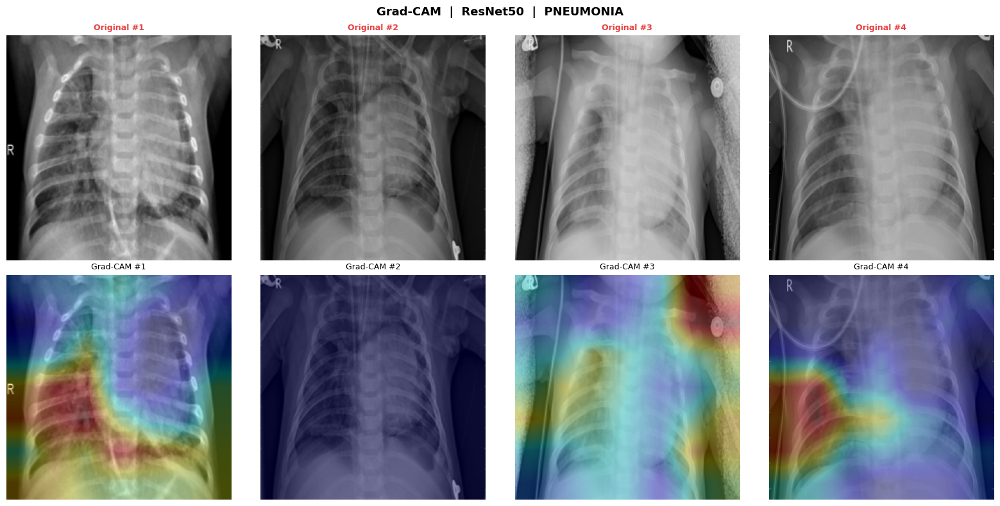

Saved: /kaggle/working/outputs/figures/gradcam_resnet50_pneumonia.pdf


In [19]:
# ── 6.3 Grad-CAM grids → PDF ─────────────────────────────────────────────────
def plot_gradcam_grid(gradcam_obj, load_fn, paths, cls_label, model_label, out_path):
    n     = len(paths)
    color = COLOR_N if cls_label == 'NORMAL' else COLOR_P
    fig, axes = plt.subplots(2, n, figsize=(n*4, 8))
    fig.suptitle(f'Grad-CAM  |  {model_label}  |  {cls_label}', fontsize=13, fontweight='bold')
    for i, path in enumerate(paths):
        img_pil, img_arr = load_fn(path)
        overlay = gradcam_obj.overlay(img_pil, gradcam_obj.compute_heatmap(img_arr))
        axes[0][i].imshow(img_pil.resize(IMG_SIZE))
        axes[0][i].set_title(f'Original #{i+1}', fontsize=9, color=color, fontweight='bold')
        axes[0][i].axis('off')
        axes[1][i].imshow(overlay); axes[1][i].set_title(f'Grad-CAM #{i+1}', fontsize=9)
        axes[1][i].axis('off')
    plt.tight_layout()
    fig.savefig(out_path, format='pdf', bbox_inches='tight', dpi=150)
    plt.show(); print(f'Saved: {out_path}')

plot_gradcam_grid(gradcam_cnn, load_for_cnn, normal_paths,    'NORMAL',    'Custom CNN',
    '/kaggle/working/outputs/figures/gradcam_cnn_normal.pdf')
plot_gradcam_grid(gradcam_cnn, load_for_cnn, pneumonia_paths, 'PNEUMONIA', 'Custom CNN',
    '/kaggle/working/outputs/figures/gradcam_cnn_pneumonia.pdf')
plot_gradcam_grid(gradcam_eff, load_for_eff, normal_paths,    'NORMAL',    'EfficientNetB0',
    '/kaggle/working/outputs/figures/gradcam_efficientnet_normal.pdf')
plot_gradcam_grid(gradcam_eff, load_for_eff, pneumonia_paths, 'PNEUMONIA', 'EfficientNetB0',
    '/kaggle/working/outputs/figures/gradcam_efficientnet_pneumonia.pdf')
plot_gradcam_grid(gradcam_res, load_for_res, normal_paths, 'NORMAL', 'ResNet50',
    '/kaggle/working/outputs/figures/gradcam_resnet50_normal.pdf')
plot_gradcam_grid(gradcam_res, load_for_res, pneumonia_paths, 'PNEUMONIA', 'ResNet50',
    '/kaggle/working/outputs/figures/gradcam_resnet50_pneumonia.pdf')

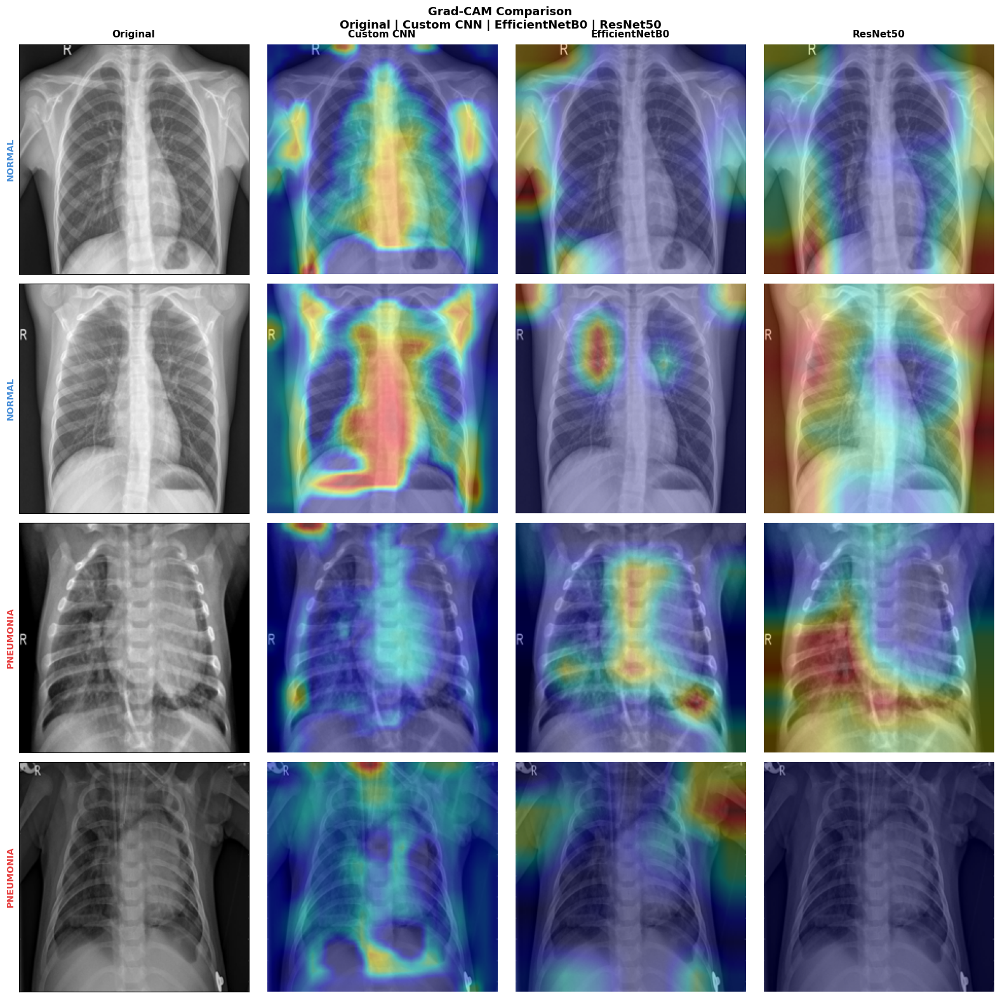

Saved: gradcam_comparison_grid.pdf


In [20]:
# ── 6.4 Side-by-side comparison grid → PDF ───────────────────────────────────
compare = [(normal_paths[0],'NORMAL'),(normal_paths[1],'NORMAL'),
           (pneumonia_paths[0],'PNEUMONIA'),(pneumonia_paths[1],'PNEUMONIA')]

fig, axes = plt.subplots(4, 4, figsize=(16,16))
fig.suptitle('Grad-CAM Comparison\nOriginal | Custom CNN | EfficientNetB0 | ResNet50',
             fontsize=13, fontweight='bold')

for col_i, title in enumerate(['Original','Custom CNN','EfficientNetB0','ResNet50']):
    axes[0][col_i].set_title(title, fontsize=11, fontweight='bold', pad=8)

for row_i, (path, cls_label) in enumerate(compare):
    color = COLOR_N if cls_label == 'NORMAL' else COLOR_P

    img_cnn, arr_cnn = load_for_cnn(path)
    img_eff, arr_eff = load_for_eff(path)
    img_res, arr_res = load_for_res(path)

    axes[row_i][0].imshow(img_cnn.resize(IMG_SIZE))
    axes[row_i][0].set_ylabel(cls_label, fontsize=10, color=color, fontweight='bold')
    axes[row_i][0].set_xticks([])
    axes[row_i][0].set_yticks([])

    axes[row_i][1].imshow(gradcam_cnn.overlay(img_cnn, gradcam_cnn.compute_heatmap(arr_cnn)))
    axes[row_i][1].axis('off')

    axes[row_i][2].imshow(gradcam_eff.overlay(img_eff, gradcam_eff.compute_heatmap(arr_eff)))
    axes[row_i][2].axis('off')

    axes[row_i][3].imshow(gradcam_res.overlay(img_res, gradcam_res.compute_heatmap(arr_res)))
    axes[row_i][3].axis('off')

plt.tight_layout()
fig.savefig('/kaggle/working/outputs/figures/gradcam_comparison_grid.pdf',
            format='pdf', bbox_inches='tight', dpi=150)
plt.show()
print('Saved: gradcam_comparison_grid.pdf')

---
# 7. Error Analysis (RQ7)

In [21]:
# ── 7.1 Build misclassified DataFrames → CSV ──────────────────────────────────
_, _, cnn_test2 = make_generators(preprocess_fn=None)
test_paths = [os.path.join(DATA_ROOT, 'test', f) for f in cnn_test2.filenames]

def build_error_df(y_true, y_pred, y_prob, file_paths, model_name):
    rows = []
    for i in range(len(y_true)):
        if y_true[i] != y_pred[i]:
            rows.append({
                'Index'      : i,
                'File'       : file_paths[i],
                'True_Label' : CLASSES[y_true[i]],
                'Pred_Label' : CLASSES[y_pred[i]],
                'Error_Type' : 'False Positive' if y_pred[i]==1 else 'False Negative',
                'Confidence' : round(float(y_prob[i]),4)
            })
    df   = pd.DataFrame(rows)
    path = f'/kaggle/working/outputs/tables/misclassified_cases_{model_name}.csv'
    df.to_csv(path, index=False)
    print(f'[{model_name}] Errors: {len(df)}/{len(y_true)}  '
          f'FP={( df["Error_Type"]=="False Positive").sum()}  '
          f'FN={(df["Error_Type"]=="False Negative").sum()}')
    return df

df_cnn_err = build_error_df(y_true, cnn_pred, cnn_prob, test_paths, 'cnn')
df_eff_err = build_error_df(y_true, eff_pred, eff_prob, test_paths, 'efficientnet')
df_res_err = build_error_df(y_true, res_pred, res_prob, test_paths, 'resnet50')
print('CNN misclassified (first 10):')
display(df_cnn_err.head(10))
print('EfficientNet misclassified (first 10):')
display(df_eff_err.head(10))
print('ResNet50 misclassified (first 10):')
display(df_res_err.head(10))
# Guard: ensure required columns exist even if model makes no errors
for _df in [df_cnn_err, df_eff_err, df_res_err]:
    if 'Error_Type' not in _df.columns:
        _df['Error_Type'] = pd.Series(dtype='str')
    if 'Confidence' not in _df.columns:
        _df['Confidence'] = pd.Series(dtype='float')


Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
  Train:4173  Val:1043  Test:624
[cnn] Errors: 59/624  FP=36  FN=23
[efficientnet] Errors: 63/624  FP=48  FN=15
[resnet50] Errors: 58/624  FP=34  FN=24
CNN misclassified (first 10):


,Index,File,True_Label,Pred_Label,Error_Type,Confidence
0,16,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9999
1,88,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.7236
2,98,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9519
3,103,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.8079
4,105,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.6761
5,108,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.6536
6,115,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.7495
7,116,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.8577
8,117,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.6048
9,118,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.6048


EfficientNet misclassified (first 10):


,Index,File,True_Label,Pred_Label,Error_Type,Confidence
0,11,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.7378
1,12,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.6900
2,16,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9985
3,20,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.8291
4,22,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.5956
5,45,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9971
6,46,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9855
7,52,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.8699
8,56,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9134
9,67,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9751


ResNet50 misclassified (first 10):


,Index,File,True_Label,Pred_Label,Error_Type,Confidence
0,16,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9566
1,45,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.9705
2,46,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.8415
3,48,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.7258
4,67,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.7480
5,83,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.7925
6,89,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.5154
7,94,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.7896
8,95,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.7896
9,98,/kaggle/input/datasets/paultimothymooney/chest...,NORMAL,PNEUMONIA,False Positive,0.8850


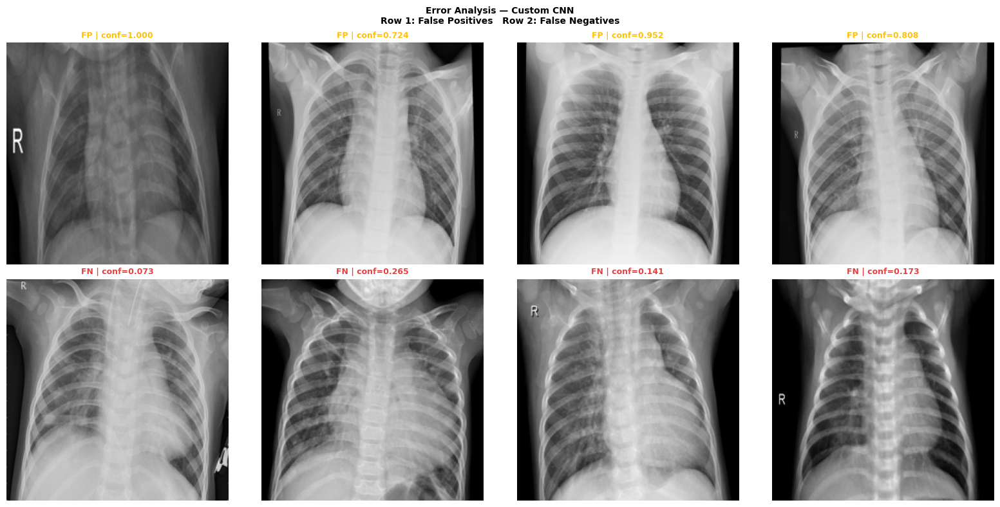

Saved: /kaggle/working/outputs/figures/error_fp_fn_cnn.pdf


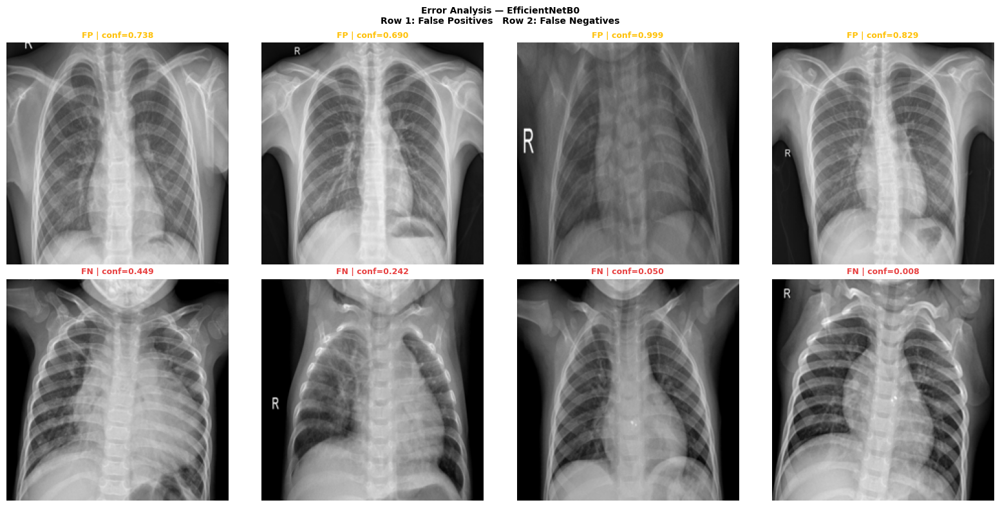

Saved: /kaggle/working/outputs/figures/error_fp_fn_efficientnet.pdf


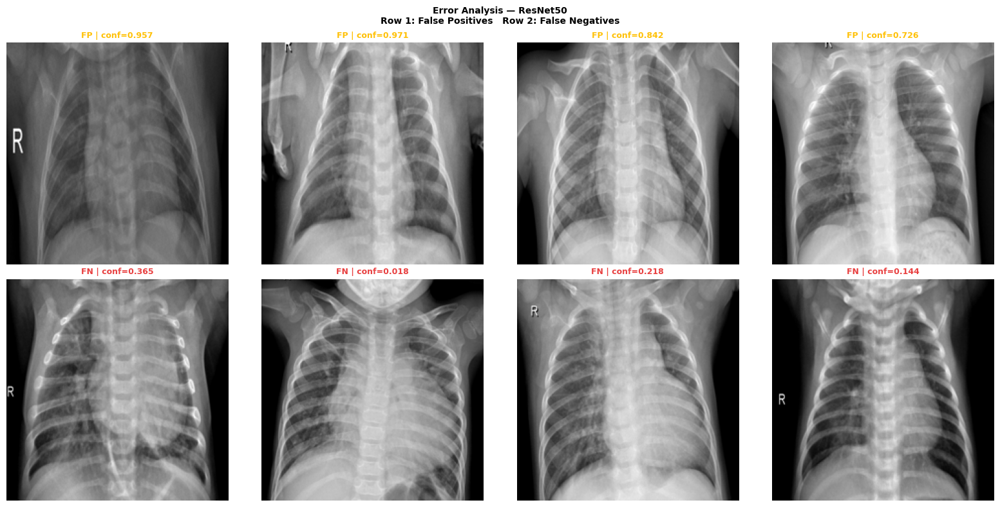

Saved: /kaggle/working/outputs/figures/error_fp_fn_resnet50.pdf


In [22]:
# ── 7.2 FP/FN sample grids → PDF ─────────────────────────────────────────────
def plot_error_grid(df_err, model_name, out_path, n=4):
    fps = df_err[df_err['Error_Type']=='False Positive'].head(n)
    fns = df_err[df_err['Error_Type']=='False Negative'].head(n)
    fig, axes = plt.subplots(2, n, figsize=(n*4, 8))
    fig.suptitle(f'Error Analysis — {model_name}\n'
                 'Row 1: False Positives   Row 2: False Negatives',
                 fontsize=10, fontweight='bold')
    for col in range(n):
        for row_idx, subset in enumerate([fps, fns]):
            ax = axes[row_idx][col]
            if col < len(subset):
                r = subset.iloc[col]
                ax.imshow(Image.open(r['File']).convert('RGB').resize(IMG_SIZE))
                color = '#FFC107' if row_idx==0 else '#E84040'
                lbl   = 'FP' if row_idx==0 else 'FN'
                ax.set_title(f"{lbl} | conf={r['Confidence']:.3f}", fontsize=9, color=color, fontweight='bold')
            ax.axis('off')
    plt.tight_layout()
    fig.savefig(out_path, format='pdf', bbox_inches='tight', dpi=150)
    plt.show(); print(f'Saved: {out_path}')

plot_error_grid(df_cnn_err, 'Custom CNN',
    '/kaggle/working/outputs/figures/error_fp_fn_cnn.pdf')
plot_error_grid(df_eff_err, 'EfficientNetB0',
    '/kaggle/working/outputs/figures/error_fp_fn_efficientnet.pdf')
plot_error_grid(df_res_err, 'ResNet50',
    '/kaggle/working/outputs/figures/error_fp_fn_resnet50.pdf')

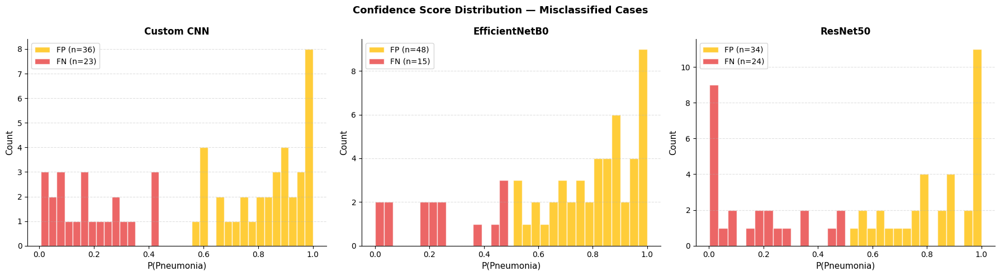

Saved: error_confidence_distribution.pdf


In [23]:
# ── 7.3 Confidence distribution → PDF ────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18,5))
fig.suptitle('Confidence Score Distribution — Misclassified Cases', fontsize=13, fontweight='bold')
for ax, (df_err, mname) in zip(axes,[(df_cnn_err,'Custom CNN'),(df_eff_err,'EfficientNetB0'),(df_res_err,'ResNet50')]):
    fps = df_err[df_err['Error_Type']=='False Positive']['Confidence']
    fns = df_err[df_err['Error_Type']=='False Negative']['Confidence']
    ax.hist(fps, bins=15, color='#FFC107', alpha=0.8, label=f'FP (n={len(fps)})', edgecolor='white')
    ax.hist(fns, bins=15, color='#E84040', alpha=0.8, label=f'FN (n={len(fns)})', edgecolor='white')
    ax.set_xlabel('P(Pneumonia)', fontsize=11); ax.set_ylabel('Count', fontsize=11)
    ax.set_title(mname, fontsize=12, fontweight='bold')
    ax.legend(fontsize=10); ax.grid(axis='y',linestyle='--',alpha=0.4)
    ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
fig.savefig('/kaggle/working/outputs/figures/error_confidence_distribution.pdf',
            format='pdf', bbox_inches='tight', dpi=150)
plt.show(); print('Saved: error_confidence_distribution.pdf')

---
# 8. Final Model Comparison (RQ2, RQ4)

In [24]:
# ── 8.1 Final metrics table → CSV ────────────────────────────────────────────
def extract_metrics(df_report, roc_auc, model_name):
    return {
        'Model'    : model_name,
        'Accuracy' : round(df_report.loc['accuracy','f1-score'],4) if 'accuracy' in df_report.index else np.nan,
        'Precision': round(df_report.loc['PNEUMONIA','precision'],4),
        'Recall'   : round(df_report.loc['PNEUMONIA','recall'],4),
        'F1'       : round(df_report.loc['PNEUMONIA','f1-score'],4),
        'AUC'      : round(roc_auc,4)
    }

df_final = pd.DataFrame([
    extract_metrics(df_cnn_report, cnn_auc, 'Custom CNN'),
    extract_metrics(df_eff_report, eff_auc, 'EfficientNetB0'),
    extract_metrics(df_res_report, res_auc, 'ResNet50'),
])
df_final.to_csv('/kaggle/working/outputs/tables/final_model_comparison.csv', index=False)
display(df_final)
print('Saved: final_model_comparison.csv')
display(df_final)

,Model,Accuracy,Precision,Recall,F1,AUC
0,Custom CNN,0.9054,0.9107,0.9410,0.9256,0.9583
1,EfficientNetB0,0.8990,0.8865,0.9615,0.9225,0.9645
2,ResNet50,0.9071,0.9150,0.9385,0.9266,0.9623


Saved: final_model_comparison.csv


,Model,Accuracy,Precision,Recall,F1,AUC
0,Custom CNN,0.9054,0.9107,0.9410,0.9256,0.9583
1,EfficientNetB0,0.8990,0.8865,0.9615,0.9225,0.9645
2,ResNet50,0.9071,0.9150,0.9385,0.9266,0.9623


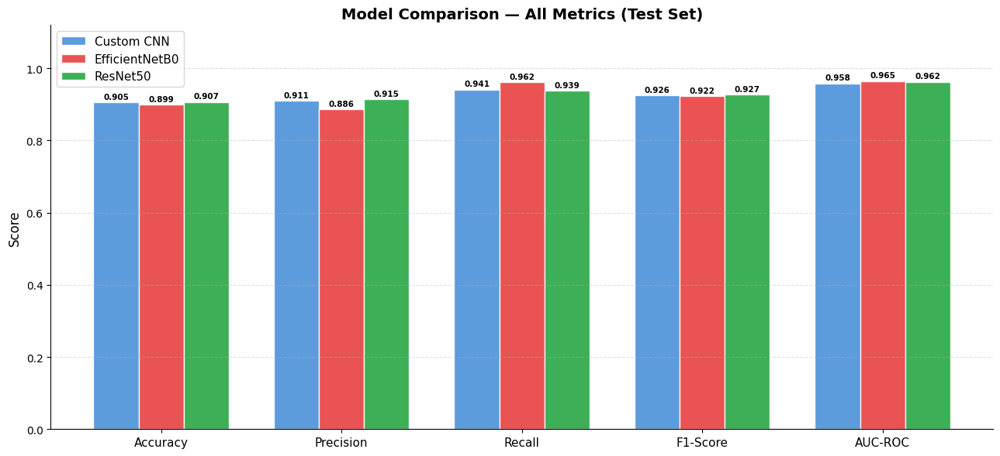

Saved: model_comparison_bar.pdf


In [25]:
# ── 8.2 Grouped bar chart → PDF ──────────────────────────────────────────────
metrics = ['Accuracy','Precision','Recall','F1','AUC']
labels  = ['Accuracy','Precision','Recall','F1-Score','AUC-ROC']
models  = df_final['Model'].tolist()
x, w    = np.arange(len(metrics)), 0.25

fig, ax = plt.subplots(figsize=(13,6))
for i, mname in enumerate(models):
    vals = df_final[df_final['Model']==mname][metrics].values[0]
    bars = ax.bar(x+i*w-w, vals, width=w, label=mname,
                  color=COLORS[mname], edgecolor='white', alpha=0.9)
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
                f'{val:.3f}', ha='center', va='bottom', fontsize=7.5, fontweight='bold')
ax.set_xticks(x); ax.set_xticklabels(labels, fontsize=11)
ax.set_ylabel('Score',fontsize=12); ax.set_ylim(0,1.12)
ax.set_title('Model Comparison — All Metrics (Test Set)',fontsize=14,fontweight='bold')
ax.legend(fontsize=11); ax.grid(axis='y',linestyle='--',alpha=0.4)
ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
fig.savefig('/kaggle/working/outputs/figures/model_comparison_bar.pdf',
            format='pdf', bbox_inches='tight', dpi=150)
plt.show(); print('Saved: model_comparison_bar.pdf')

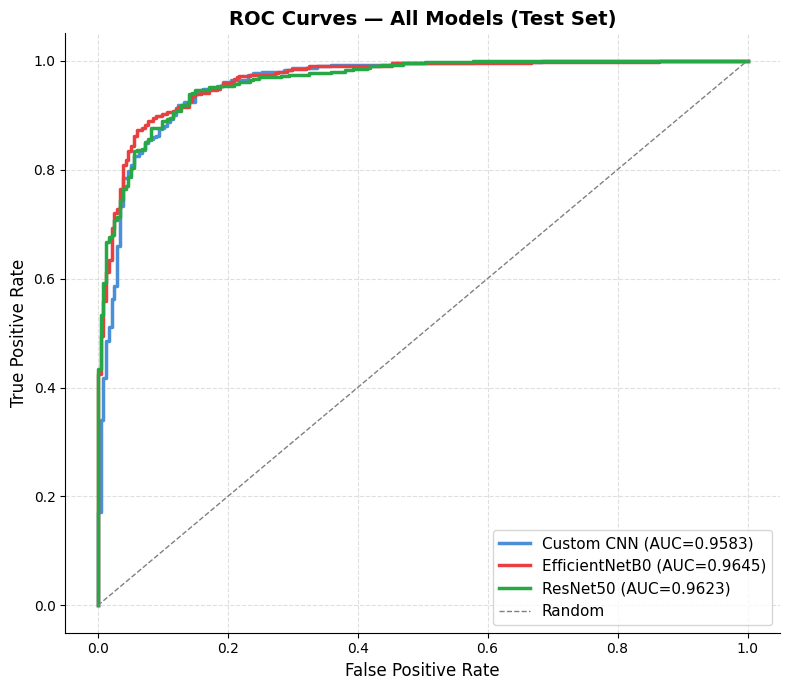

Saved: roc_curves_overlay.pdf


In [26]:
# ── 8.3 ROC curves overlay → PDF ─────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(8,7))
for mname, fpr, tpr, roc_auc in [
    ('Custom CNN',     cnn_fpr, cnn_tpr, cnn_auc),
    ('EfficientNetB0', eff_fpr, eff_tpr, eff_auc),
    ('ResNet50',       res_fpr, res_tpr, res_auc),
]:
    ax.plot(fpr, tpr, color=COLORS[mname], lw=2.5, label=f'{mname} (AUC={roc_auc:.4f})')
ax.plot([0,1],[0,1],color='grey',linestyle='--',lw=1,label='Random')
ax.set_xlabel('False Positive Rate',fontsize=12); ax.set_ylabel('True Positive Rate',fontsize=12)
ax.set_title('ROC Curves — All Models (Test Set)',fontsize=14,fontweight='bold')
ax.legend(fontsize=11,loc='lower right'); ax.grid(linestyle='--',alpha=0.4)
ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
fig.savefig('/kaggle/working/outputs/figures/roc_curves_overlay.pdf',
            format='pdf', bbox_inches='tight', dpi=150)
plt.show(); print('Saved: roc_curves_overlay.pdf')

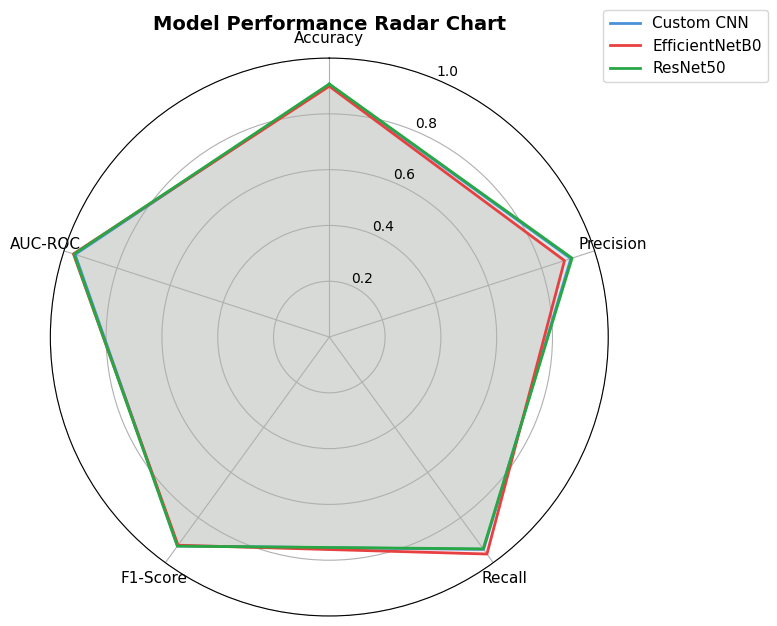

Saved: model_comparison_radar.pdf


In [27]:
# ── 8.4 Radar chart → PDF ────────────────────────────────────────────────────
radar_metrics = ['Accuracy','Precision','Recall','F1','AUC']
radar_labels  = ['Accuracy','Precision','Recall','F1-Score','AUC-ROC']
N      = len(radar_metrics)
angles = [n/float(N)*2*np.pi for n in range(N)]; angles += angles[:1]

fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(polar=True))
ax.set_theta_offset(np.pi/2); ax.set_theta_direction(-1)
ax.set_xticks(angles[:-1]); ax.set_xticklabels(radar_labels, fontsize=11)
ax.set_ylim(0,1)
ax.set_title('Model Performance Radar Chart',fontsize=14,fontweight='bold',pad=20)
for mname in models:
    vals = df_final[df_final['Model']==mname][radar_metrics].values[0].tolist()
    vals += vals[:1]
    ax.plot(angles, vals, color=COLORS[mname], lw=2, label=mname)
    ax.fill(angles, vals, color=COLORS[mname], alpha=0.1)
ax.legend(loc='upper right', bbox_to_anchor=(1.3,1.1), fontsize=11)
plt.tight_layout()
fig.savefig('/kaggle/working/outputs/figures/model_comparison_radar.pdf',
            format='pdf', bbox_inches='tight', dpi=150)
plt.show(); print('Saved: model_comparison_radar.pdf')

In [28]:
# ── 8.5 Best model summary ────────────────────────────────────────────────────
print('='*55)
print('FINAL MODEL COMPARISON SUMMARY')
print('='*55)
display(df_final)
print()
print(f'Best AUC    : {df_final.loc[df_final["AUC"].idxmax(),"Model"]}')
print(f'Best Recall : {df_final.loc[df_final["Recall"].idxmax(),"Model"]}  ← most critical for pneumonia')
print(f'Best F1     : {df_final.loc[df_final["F1"].idxmax(),"Model"]}')
print()
print('All outputs saved to /kaggle/working/outputs/')

FINAL MODEL COMPARISON SUMMARY


,Model,Accuracy,Precision,Recall,F1,AUC
0,Custom CNN,0.9054,0.9107,0.9410,0.9256,0.9583
1,EfficientNetB0,0.8990,0.8865,0.9615,0.9225,0.9645
2,ResNet50,0.9071,0.9150,0.9385,0.9266,0.9623



Best AUC    : EfficientNetB0
Best Recall : EfficientNetB0  ← most critical for pneumonia
Best F1     : ResNet50

All outputs saved to /kaggle/working/outputs/


In [29]:
# ── Final: Zip all generated outputs ────────────────────────────────────────
import os
import zipfile
from datetime import datetime

OUTPUT_DIR = "/kaggle/working/outputs"
ZIP_PATH = "/kaggle/working/outputs.zip"

with zipfile.ZipFile(ZIP_PATH, "w", zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(OUTPUT_DIR):
        for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, "/kaggle/working")
            zipf.write(file_path, arcname)

print("✅ Outputs zipped successfully!")
print("ZIP file:", ZIP_PATH)
print("Created at:", datetime.now())
print("File size:", round(os.path.getsize(ZIP_PATH) / (1024 * 1024), 2), "MB")

✅ Outputs zipped successfully!
ZIP file: /kaggle/working/outputs.zip
Created at: 2026-06-23 22:57:47.505262
File size: 244.91 MB
